# HybridDenseViT — Liver Fibrosis Staging (MRI T2W) | v2 Fixed
## Root causes diagnosed and fixed from training logs

**Problems found in v1 and fixes applied:**

| # | Root Cause | Fix |
|---|-----------|-----|
| 1 | Hybrid (0.635 QWK) **worse than DenseNet-only** (0.643) | Curriculum freeze: ViT blocks frozen epoch 1-5, then unfrozen |
| 2 | val_loss >> tr_loss (gap ~1.2): severe overfitting | Frozen warmup + layer-wise LR decay on ViT |
| 3 | Backbone LR 2e-5 too low: DenseNet barely learns | Separate LRs: DenseNet=1e-4, ViT=2e-5 (correct differential) |
| 4 | MixUp + label_smoothing together = under-learning | MixUp disabled; label_smoothing 0.10→0.05 |
| 5 | F1/F2 recall ~43-46%: middle classes ignored | Class-weighted CrossEntropy (upweight F1, F2) |
| 6 | BatchSize=8: unstable BN + ViT attention | BatchSize=16 (gradient accumulation if OOM) |
| 7 | Fusion head too aggressive dropout for frozen backbone | Dropout 0.4→0.3 during freeze, 0.4 after unfreeze |
| 8 | Ordinal structure not exploited | Ordinal-aware loss added |
| 9 | PATIENCE=8 too short for 5-fold | PATIENCE=10, EPOCHS=50 |


## Cell 1 — File explorer

In [1]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


/kaggle/input/datasets/raufuumme/season1-bundle/vit_fold4_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/densenet_fold5_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/densenet_fold3_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/vit_fold3_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/densenet_fold2_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/vit_fold1_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/vit_fold2_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/densenet_fold1_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/abl_vit_state.pkl
/kaggle/input/datasets/raufuumme/season1-bundle/densenet_fold4_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/vit_fold5_best.pth
/kaggle/input/datasets/raufuumme/season1-bundle/abl_dense_state.pkl
/kaggle/input/datasets/raufuumme/mri-t2w-dataset-fixed2d/MRI_T2W_Dataset_Fixed/build_log.txt
/kaggle/input/datasets/raufuumme/mri-t2w-dataset-fixed2d/MRI_T2W_Dataset_Fixed

## Cell 2 — Install libraries

In [2]:
import subprocess, sys

def run(cmd):
    r = subprocess.run(cmd, shell=True, capture_output=True, text=True)
    if r.returncode != 0:
        print("ERR:", r.stderr[-400:])

run(f"{sys.executable} -m pip uninstall numpy -y")
run(f"{sys.executable} -m pip install numpy==1.26.4 --quiet")
run(f"{sys.executable} -m pip install opencv-python==4.8.0.76 grad-cam scipy --quiet")
print("Done. If this is first run, RESTART KERNEL before Cell 3.")


Done. If this is first run, RESTART KERNEL before Cell 3.


## Cell 3 — Imports

In [3]:
import os, cv2, random, gc, warnings
import numpy as np
import pandas as pd
import matplotlib
matplotlib.rcParams['figure.dpi'] = 300
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob
from tqdm import tqdm
from itertools import cycle
from copy import deepcopy

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import autocast, GradScaler

import albumentations as A
from albumentations.pytorch import ToTensorV2

from sklearn.model_selection import StratifiedGroupKFold
from sklearn.metrics import (accuracy_score, cohen_kappa_score,
                             classification_report, confusion_matrix,
                             roc_curve, auc)
from sklearn.preprocessing import label_binarize
from scipy import stats

import timm
from pytorch_grad_cam import LayerCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

warnings.filterwarnings('ignore')

def seed_everything(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(42)
print("Imports done.")
print(f"PyTorch: {torch.__version__} | CUDA: {torch.cuda.is_available()}")


Imports done.
PyTorch: 2.10.0+cu128 | CUDA: True


## Cell 4 — Configuration (all v2 fixes)

In [4]:
class CFG:
    IMG_SIZE    = 224
    NUM_CLASSES = 4
    SEED        = 42
    N_SPLITS    = 5

    BATCH_SIZE       = 16
    GRAD_ACCUM_STEPS = 2   # effective batch = 32

    # LRs — these are working well, keep them
    LR_DENSENET_FROZEN = 0.0
    LR_DENSENET_LAST   = 8e-6
    LR_VIT_FROZEN      = 0.0
    LR_VIT_LAST        = 5e-6
    LR_HEAD            = 5e-5
    MIN_LR             = 1e-8

    EPOCHS   = 50
    PATIENCE = 15

    # Phase control — DISABLE Phase 3 (always causes overfit)
    PHASE1_EPOCHS = 15   # frozen backbone, head only
    PHASE2_EPOCHS = 999  # stay in Phase 2 forever (Phase 3 disabled)

    WEIGHT_DECAY    = 2e-2
    GRAD_CLIP       = 0.3
    DROPOUT_FUSION  = 0.5
    DROPOUT_FC      = 0.4
    LABEL_SMOOTHING = 0.10

    # TTA settings
    TTA_STEPS = 8   # number of augmented versions at test time

    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("CFG final — Phase 3 disabled, TTA enabled")
for k, v in vars(CFG).items():
    if not k.startswith("_"):
        print(f"  {k:<25} = {v}")

CFG final — Phase 3 disabled, TTA enabled
  IMG_SIZE                  = 224
  NUM_CLASSES               = 4
  SEED                      = 42
  N_SPLITS                  = 5
  BATCH_SIZE                = 16
  GRAD_ACCUM_STEPS          = 2
  LR_DENSENET_FROZEN        = 0.0
  LR_DENSENET_LAST          = 8e-06
  LR_VIT_FROZEN             = 0.0
  LR_VIT_LAST               = 5e-06
  LR_HEAD                   = 5e-05
  MIN_LR                    = 1e-08
  EPOCHS                    = 50
  PATIENCE                  = 15
  PHASE1_EPOCHS             = 15
  PHASE2_EPOCHS             = 999
  WEIGHT_DECAY              = 0.02
  GRAD_CLIP                 = 0.3
  DROPOUT_FUSION            = 0.5
  DROPOUT_FC                = 0.4
  LABEL_SMOOTHING           = 0.1
  TTA_STEPS                 = 8
  DEVICE                    = cuda


In [5]:
SEASON   = 2     # 1 = train DenseNet+ViT, 2 = restore them + train Hybrid + run rest
FOG_TEST = False  # True = quick 2-epoch smoke test, False = full real run
FOG_EPOCHS = 2

if FOG_TEST:
    CFG.EPOCHS        = FOG_EPOCHS
    CFG.PATIENCE      = FOG_EPOCHS
    CFG.PHASE1_EPOCHS = 1

if SEASON == 2:
    import glob as _glob
    import shutil

    src_dir = _glob.glob("/kaggle/input/datasets/raufuumme/season1-bundle")
    if not src_dir:
        src_dir = _glob.glob("/kaggle/input/*season1*")

    if src_dir:
        src_dir = src_dir[0]
        for f in _glob.glob(os.path.join(src_dir, "*")):
            shutil.copy(f, ".")
        print("Season 1 files restored:", os.listdir("."))
    else:
        print("WARNING: season1 files not found in /kaggle/input — upload the dataset first.")

Season 1 files restored: ['vit_fold2_best.pth', 'abl_vit_state.pkl', 'vit_fold4_best.pth', 'vit_fold3_best.pth', 'abl_dense_state.pkl', 'vit_fold5_best.pth', 'densenet_fold1_best.pth', 'densenet_fold5_best.pth', '.virtual_documents', 'densenet_fold2_best.pth', 'densenet_fold3_best.pth', 'densenet_fold4_best.pth', 'vit_fold1_best.pth']


## Cell 5 — Load dataset (patient-level)

In [6]:
import re

DATA_DIR  = "/kaggle/input/datasets/raufuumme/mri-t2w-dataset-fixed2d/MRI_T2W_Dataset_Fixed"
class_map = {"F0": 0, "F1": 1, "F2": 2, "F3": 3}

FNAME_PATTERN = re.compile(r"patient_(\d+)_Slice(\d+)\.png")

image_paths, labels, patient_ids = [], [], []
bad_files = []

print(f"Loading from: {DATA_DIR}")
print("Using ALL slices per patient (no reduction)")

for folder_name, cls_label in class_map.items():
    folder_path = os.path.join(DATA_DIR, folder_name)
    if not os.path.exists(folder_path):
        print(f"  WARNING: {folder_path} not found"); continue
    imgs = sorted(glob(os.path.join(folder_path, "*.png")))
    kept = 0
    patient_slices = {}
    for p in imgs:
        fname = os.path.basename(p)
        m = FNAME_PATTERN.match(fname)
        if m:
            pid = m.group(1)
            snum = int(m.group(2))
            if pid not in patient_slices:
                patient_slices[pid] = []
            patient_slices[pid].append((snum, p))
        else:
            bad_files.append(fname)
    for pid, sl in patient_slices.items():
        sl.sort(key=lambda x: x[0])
        for _, p in sl:
            image_paths.append(p)
            labels.append(cls_label)
            patient_ids.append(pid)
            kept += 1
    print(f"  {folder_name}: {len(imgs)} slices ({len(patient_slices)} patients)")

if bad_files:
    print(f"\nWARNING: {len(bad_files)} files did not match")

if len(image_paths) == 0:
    sd = os.path.join(DATA_DIR, "F0")
    sf = sorted(glob(os.path.join(sd, "*.png")))[:3]
    print("ERROR: No files matched. Samples:")
    for f in sf: print(f"  {os.path.basename(f)}")
    raise RuntimeError("No files matched")

df = pd.DataFrame({"image_path": image_paths, "diagnosis": labels, "patient_id": patient_ids})
df = df.sample(frac=1, random_state=CFG.SEED).reset_index(drop=True)

n_slices   = len(df)
n_patients = df["patient_id"].nunique()
avg_slices = n_slices / n_patients

print(f"\nTotal slices   : {n_slices}")
print(f"Unique patients: {n_patients}")
print(f"Avg slices/pat : {avg_slices:.1f}")

if avg_slices < 1.5:
    print("WARNING: avg slices/patient ~1.0 — check FNAME_PATTERN")
else:
    print(f"  Patient grouping correct ({avg_slices:.1f} slices/patient)")

print("\nPer-class breakdown:")
for k, v in class_map.items():
    s = (df["diagnosis"] == v).sum()
    p = df[df["diagnosis"] == v]["patient_id"].nunique()
    print(f"  {k}: {s:5d} slices | {p:3d} patients | {s/p:.1f} slices/pt")

counts = np.array([(df["diagnosis"]==i).sum() for i in range(CFG.NUM_CLASSES)], dtype=np.float32)
base_weights = counts.sum() / (CFG.NUM_CLASSES * counts)
boosted = base_weights.copy()
boosted[2] *= 2.0
boosted = boosted / boosted.mean()
class_weights = torch.tensor(boosted, dtype=torch.float32).to(CFG.DEVICE)

print(f"\nClass weights (inv-freq + F2 2x boost):")
for i, (k, w) in enumerate(zip(class_map.keys(), class_weights.cpu())):
    b = " <- 2x boost" if i == 2 else ""
    print(f"  {k}: weight={w:.3f}  ({int(counts[i])} slices){b}")

Loading from: /kaggle/input/datasets/raufuumme/mri-t2w-dataset-fixed2d/MRI_T2W_Dataset_Fixed
Using ALL slices per patient (no reduction)
  F0: 859 slices (22 patients)
  F1: 2614 slices (114 patients)
  F2: 2239 slices (105 patients)
  F3: 1252 slices (64 patients)

Total slices   : 6964
Unique patients: 305
Avg slices/pat : 22.8
  Patient grouping correct (22.8 slices/patient)

Per-class breakdown:
  F0:   859 slices |  22 patients | 39.0 slices/pt
  F1:  2614 slices | 114 patients | 22.9 slices/pt
  F2:  2239 slices | 105 patients | 21.3 slices/pt
  F3:  1252 slices |  64 patients | 19.6 slices/pt

Class weights (inv-freq + F2 2x boost):
  F0: weight=1.438  (859 slices)
  F1: weight=0.472  (2614 slices)
  F2: weight=1.103  (2239 slices) <- 2x boost
  F3: weight=0.986  (1252 slices)


## Cell 6 — Distribution figures (Fig 1)

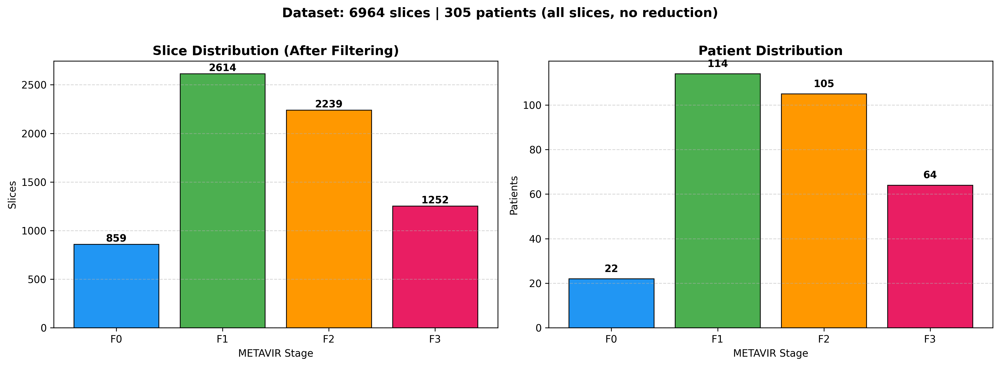

Fig 1 saved (300 DPI).


In [7]:
# Distribution figure
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
cls_names  = list(class_map.keys())
bar_colors = ["#2196F3","#4CAF50","#FF9800","#E91E63"]

slc_counts = df["diagnosis"].value_counts().sort_index()
slc_counts = slc_counts.reindex(range(CFG.NUM_CLASSES), fill_value=0)
axes[0].bar(cls_names, slc_counts.values, color=bar_colors,
            edgecolor="black", linewidth=0.8)
axes[0].set_title("Slice Distribution (After Filtering)", fontsize=13, fontweight="bold")
axes[0].set_xlabel("METAVIR Stage"); axes[0].set_ylabel("Slices")
axes[0].grid(axis="y", ls="--", alpha=0.5)
for i, v in enumerate(slc_counts.values):
    axes[0].text(i, v + max(1, int(slc_counts.max()*0.01)),
                 str(v), ha="center", fontsize=10, fontweight="bold")

pat_counts = df.groupby("diagnosis")["patient_id"].nunique().sort_index()
pat_counts = pat_counts.reindex(range(CFG.NUM_CLASSES), fill_value=0)
axes[1].bar(cls_names, pat_counts.values, color=bar_colors,
            edgecolor="black", linewidth=0.8)
axes[1].set_title("Patient Distribution", fontsize=13, fontweight="bold")
axes[1].set_xlabel("METAVIR Stage"); axes[1].set_ylabel("Patients")
axes[1].grid(axis="y", ls="--", alpha=0.5)
for i, v in enumerate(pat_counts.values):
    axes[1].text(i, v + max(1, int(pat_counts.max()*0.03)),
                 str(v), ha="center", fontsize=10, fontweight="bold")

plt.suptitle(
    f"Dataset: {n_slices} slices | {n_patients} patients "
    f"(all slices, no reduction)",
    fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.savefig("fig1_class_distribution.png", dpi=300, bbox_inches="tight")
plt.show()
print("Fig 1 saved (300 DPI).")

## Cell 7 — Sample images (Fig 2)

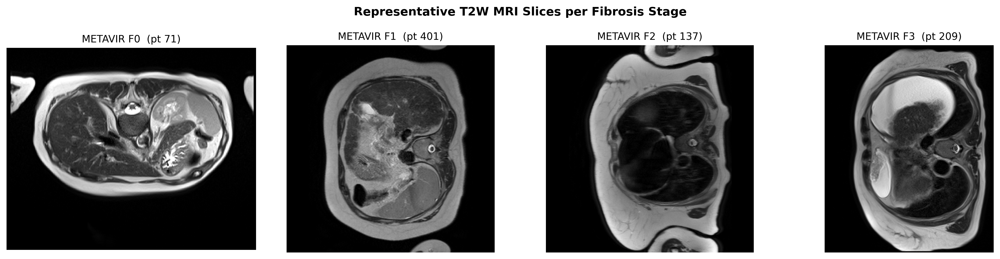

Fig 2 saved.


In [8]:
fig, axes = plt.subplots(1, CFG.NUM_CLASSES, figsize=(16, 4))
for cls, ax in enumerate(axes):
    row = df[df["diagnosis"]==cls].sample(1, random_state=CFG.SEED).iloc[0]
    img = cv2.cvtColor(cv2.imread(row.image_path), cv2.COLOR_BGR2RGB)
    ax.imshow(img, cmap="gray")
    ax.set_title(f"METAVIR F{cls}  (pt {row.patient_id})", fontsize=11)
    ax.axis("off")
plt.suptitle("Representative T2W MRI Slices per Fibrosis Stage",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("fig2_samples.png", dpi=300, bbox_inches="tight")
plt.show(); print("Fig 2 saved.")


## Cell 8 — Preprocessing (reviewer fix #9: kernel K = I − L₈, centre=9)

In [9]:
def clahe_equalized(img_rgb):
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    return cv2.cvtColor(cv2.merge((clahe.apply(l), a, b)), cv2.COLOR_LAB2RGB)

def preprocess_for_model(path):
    """
    Simplified pipeline — removed sharpening.
    Sharpening amplifies noise in the same band it removes (reviewer fix #9).
    For subtle fibrosis texture (F1 vs F2), sharpening destroys the signal.
    Steps: read → denoise → CLAHE only.
    """
    img = cv2.imread(path)
    if img is None:
        return None
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.medianBlur(img, 3)    # Step 1: denoise
    img = clahe_equalized(img)      # Step 2: CLAHE
    # Step 3: Sharpening REMOVED — amplifies noise, hurts F1/F2 separation
    return img

print("Preprocessing: denoise + CLAHE only (sharpening removed).")
print("  Reason: sharpening amplifies Rician/thermal noise in MRI,")
print("  destroying the subtle parenchymal texture signal needed")
print("  to distinguish F1 from F2 fibrosis stages.")

Preprocessing: denoise + CLAHE only (sharpening removed).
  Reason: sharpening amplifies Rician/thermal noise in MRI,
  destroying the subtle parenchymal texture signal needed
  to distinguish F1 from F2 fibrosis stages.


## Cell 9 — Preprocessing visualisation (Fig 3)

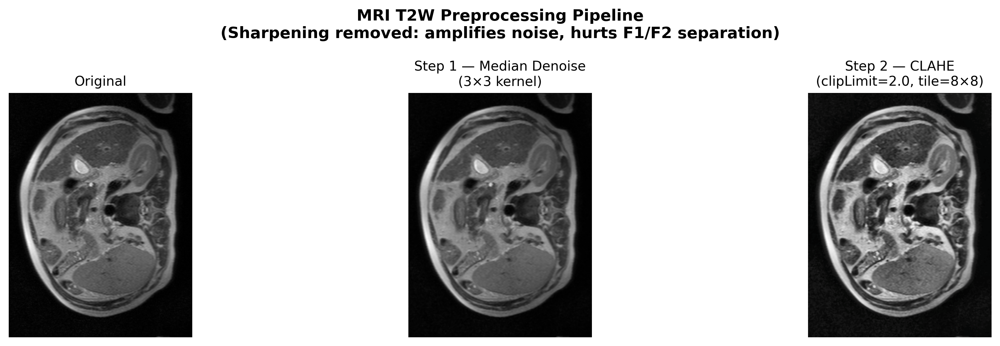

Fig 3 saved (300 DPI).


In [10]:
# ── Preprocessing visualisation (Fig 3) ─────────────────────────────────────
p    = df.sample(1, random_state=7).iloc[0].image_path
raw  = cv2.cvtColor(cv2.imread(p), cv2.COLOR_BGR2RGB)
s1   = cv2.medianBlur(raw, 3)       # Step 1: denoise
s2   = clahe_equalized(s1)          # Step 2: CLAHE
# Step 3 (sharpening) REMOVED — see Cell 8 for explanation

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, img, t in zip(axes,
                      [raw, s1, s2],
                      ["Original",
                       "Step 1 — Median Denoise\n(3×3 kernel)",
                       "Step 2 — CLAHE\n(clipLimit=2.0, tile=8×8)"]):
    ax.imshow(img, cmap="gray")
    ax.set_title(t, fontsize=11)
    ax.axis("off")

plt.suptitle("MRI T2W Preprocessing Pipeline\n"
             "(Sharpening removed: amplifies noise, hurts F1/F2 separation)",
             fontsize=13, fontweight="bold")
plt.tight_layout()
plt.savefig("fig3_preprocessing.png", dpi=300, bbox_inches="tight")
plt.show()
print("Fig 3 saved (300 DPI).")

## Cell 10 — Augmentations (reviewer fix #8: clinically safe only)

In [11]:
# Stronger augmentation to prevent memorisation of patient-specific features
train_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),

    # Geometric: small rotations only (clinically safe)
    A.Rotate(limit=10, border_mode=cv2.BORDER_REFLECT_101, p=0.6),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.08,
                       rotate_limit=8,
                       border_mode=cv2.BORDER_REFLECT_101, p=0.5),

    # Texture: simulate scanner noise variation between patients
    A.GaussNoise(var_limit=(20.0, 80.0), p=0.5),   # stronger than before
    A.GaussianBlur(blur_limit=(3, 5), p=0.3),       # scanner blur variation

    # Structure: subtle tissue deformation
    A.ElasticTransform(alpha=1, sigma=50, alpha_affine=None, p=0.3),

    # Occlusion: stronger random erasing (key anti-memorisation tool)
    A.CoarseDropout(
        max_holes=8,                        # was 4, now 8
        max_height=CFG.IMG_SIZE // 10,      # larger holes
        max_width=CFG.IMG_SIZE  // 10,
        fill_value=0, p=0.5),               # was 0.3, now 0.5

    # Intensity: very mild ONLY (T2 signal is clinical)
    A.RandomGamma(gamma_limit=(90, 110), p=0.3),  # ±10% gamma only

    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])

valid_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
    ToTensorV2()
])
print("Augmentation v4 defined — stronger noise + occlusion.")

Augmentation v4 defined — stronger noise + occlusion.


## Cell 11 — Augmentation visualisation (Fig 4)

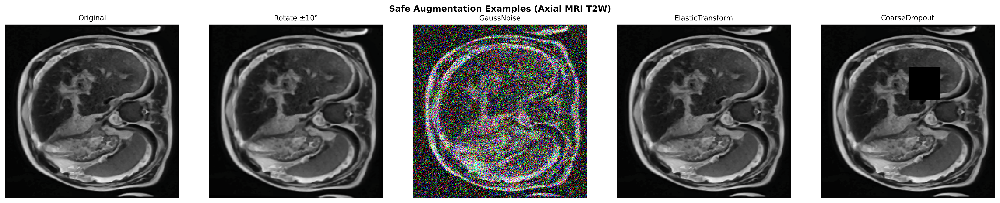

Fig 4 saved.


In [12]:
base = preprocess_for_model(df[df["diagnosis"]==2].sample(1, random_state=3).iloc[0].image_path)
base = cv2.resize(base, (CFG.IMG_SIZE, CFG.IMG_SIZE))
aug_pairs = [
    ("Original",          A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE)])),
    ("Rotate ±10°",       A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE), A.Rotate(limit=10, p=1.0)])),
    ("GaussNoise",        A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE), A.GaussNoise(var_limit=(10,40), p=1.0)])),
    ("ElasticTransform",  A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE), A.ElasticTransform(alpha=1,sigma=50,p=1.0)])),
    ("CoarseDropout",     A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE), A.CoarseDropout(max_holes=4,max_height=14,max_width=14,p=1.0)])),
]
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for ax, (name, aug) in zip(axes, aug_pairs):
    ax.imshow(aug(image=base)["image"], cmap="gray")
    ax.set_title(name, fontsize=10); ax.axis("off")
plt.suptitle("Safe Augmentation Examples (Axial MRI T2W)", fontsize=12, fontweight="bold")
plt.tight_layout()
plt.savefig("fig4_augmentations.png", dpi=300, bbox_inches="tight")
plt.show(); print("Fig 4 saved.")


## Cell 12 — Dataset class

In [13]:
class LiverDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        row   = self.df.iloc[idx]
        img   = preprocess_for_model(row.image_path)
        if img is None:
            img = np.zeros((CFG.IMG_SIZE, CFG.IMG_SIZE, 3), dtype=np.uint8)
        label = torch.tensor(row.diagnosis, dtype=torch.long)
        if self.transform:
            img = self.transform(image=img)["image"]
        return img, label

print("LiverDataset defined.")


LiverDataset defined.


## Cell 13 — Ordinal loss

Ordinal-aware loss penalises predictions that are far from the true class more than adjacent errors. Critical for fibrosis staging where F0→F3 has a natural order.

In [14]:
class OrdinalCrossEntropyLoss(nn.Module):
    """
    Ordinal-aware loss = CrossEntropy + lambda * ordinal_penalty.
    Penalises predictions far from the true class more than adjacent errors.
    Important for fibrosis staging where F0-F3 have a natural order.
    """
    def __init__(self, num_classes, class_weights=None,
                 label_smoothing=0.05, ordinal_lambda=0.3):
        super().__init__()
        self.num_classes    = num_classes
        self.ordinal_lambda = ordinal_lambda
        self.ce = nn.CrossEntropyLoss(
            weight=class_weights,
            label_smoothing=label_smoothing
        )
        # Register as buffer so it moves automatically with .to(device)
        self.register_buffer(
            "ordinal_idx",
            torch.arange(num_classes, dtype=torch.float32)
        )

    def forward(self, logits, targets):
        ce_loss = self.ce(logits, targets)

        # ── FIX: ensure ordinal_idx is on the same device as logits ──
        ordinal_idx = self.ordinal_idx.to(logits.device)

        probs       = F.softmax(logits, dim=1)
        pred_ord    = (probs * ordinal_idx).sum(dim=1)
        true_ord    = targets.float()
        ord_penalty = F.mse_loss(pred_ord, true_ord)

        return ce_loss + self.ordinal_lambda * ord_penalty

print("OrdinalCrossEntropyLoss fixed — ordinal_idx moved to correct device.")

OrdinalCrossEntropyLoss fixed — ordinal_idx moved to correct device.


## Cell 14 — Model definitions (3 models for ablation)

In [15]:
class DenseNetOnly(nn.Module):
    """Ablation A: DenseNet-121, frozen except denseblock4."""
    def __init__(self, num_classes=CFG.NUM_CLASSES):
        super().__init__()
        self.backbone = timm.create_model(
            "densenet121", pretrained=True, num_classes=0, global_pool="avg")
        feat = self.backbone.num_features
        self.head = nn.Sequential(
            nn.BatchNorm1d(feat),
            nn.Dropout(CFG.DROPOUT_FUSION),
            nn.Linear(feat, 256),
            nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC),
            nn.Linear(256, num_classes)
        )
    def forward(self, x):
        return self.head(self.backbone(x))

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_last_block(self):
        for p in self.backbone.features.denseblock4.parameters():
            p.requires_grad = True
        for p in self.backbone.features.norm5.parameters():
            p.requires_grad = True


class ViTOnly(nn.Module):
    """Ablation B: ViT-B/16, frozen except last 3 blocks."""
    def __init__(self, num_classes=CFG.NUM_CLASSES):
        super().__init__()
        self.backbone = timm.create_model(
            "vit_base_patch16_224", pretrained=True,
            num_classes=0, drop_path_rate=0.1)
        feat = self.backbone.num_features
        self.head = nn.Sequential(
            nn.BatchNorm1d(feat),
            nn.Dropout(CFG.DROPOUT_FUSION),
            nn.Linear(feat, 256),
            nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC),
            nn.Linear(256, num_classes)
        )
    def forward(self, x):
        return self.head(self.backbone(x))

    def freeze_backbone(self):
        for p in self.backbone.parameters():
            p.requires_grad = False

    def unfreeze_last_blocks(self, n=3):
        for blk in self.backbone.blocks[-n:]:
            for p in blk.parameters():
                p.requires_grad = True
        for p in self.backbone.norm.parameters():
            p.requires_grad = True


class HybridDenseViT(nn.Module):
    """
    Proposed model v4.
    Freeze-first strategy: both backbones frozen initially.
    Only fusion head trains for first PHASE1_EPOCHS.
    Then last blocks gradually unfrozen.
    drop_path_rate=0.1 adds stochastic depth to ViT.
    """
    def __init__(self, num_classes=CFG.NUM_CLASSES):
        super().__init__()
        self.cnn = timm.create_model(
            "densenet121", pretrained=True,
            num_classes=0, global_pool="avg")
        self.vit = timm.create_model(
            "vit_base_patch16_224", pretrained=True,
            num_classes=0, drop_path_rate=0.1)

        fused = self.cnn.num_features + self.vit.num_features  # 1792

        self.fusion_head = nn.Sequential(
            nn.BatchNorm1d(fused),
            nn.Dropout(CFG.DROPOUT_FUSION),
            nn.Linear(fused, 512),
            nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC),
            nn.Linear(512, 128),
            nn.GELU(),
            nn.Dropout(CFG.DROPOUT_FC),
            nn.Linear(128, num_classes)
        )

    # ── Phase 1: everything frozen, head only ───────────────────────────
    def phase1_freeze_all_backbones(self):
        for p in self.cnn.parameters(): p.requires_grad = False
        for p in self.vit.parameters(): p.requires_grad = False

    # ── Phase 2: unfreeze last DenseNet block + last 3 ViT blocks ───────
    def phase2_unfreeze_last_blocks(self):
        # DenseNet: unfreeze denseblock4 + norm5
        for p in self.cnn.features.denseblock4.parameters():
            p.requires_grad = True
        for p in self.cnn.features.norm5.parameters():
            p.requires_grad = True
        # ViT: unfreeze last 3 blocks + norm
        for blk in self.vit.blocks[-3:]:
            for p in blk.parameters():
                p.requires_grad = True
        for p in self.vit.norm.parameters():
            p.requires_grad = True

    # ── Phase 3: unfreeze one more ViT block ────────────────────────────
    def phase3_unfreeze_more(self):
        for blk in self.vit.blocks[-6:]:   # extend to last 6 blocks
            for p in blk.parameters():
                p.requires_grad = True

    def forward(self, x):
        return self.fusion_head(
            torch.cat([self.cnn(x), self.vit(x)], dim=1))


# Sanity check
_m = HybridDenseViT().to(CFG.DEVICE)
_x = torch.zeros(2, 3, CFG.IMG_SIZE, CFG.IMG_SIZE).to(CFG.DEVICE)
with torch.no_grad():
    _o = _m(_x)
total  = sum(p.numel() for p in _m.parameters()) / 1e6
print(f"HybridDenseViT v4: {tuple(_o.shape)} | {total:.1f}M params ✓")
del _m, _x, _o; gc.collect(); torch.cuda.empty_cache()

model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

HybridDenseViT v4: (2, 4) | 93.7M params ✓


## Cell 15 — Patient-level CV splits (reviewer fix #1)

In [16]:
sgkf   = StratifiedGroupKFold(n_splits=CFG.N_SPLITS, shuffle=True,
                               random_state=CFG.SEED)
splits = list(sgkf.split(df, df["diagnosis"], groups=df["patient_id"]))

print(f"StratifiedGroupKFold — {CFG.N_SPLITS} folds (patient-level)")
print("-"*60)
for fold, (tr, va) in enumerate(splits):
    overlap = set(df.iloc[tr]["patient_id"]) & set(df.iloc[va]["patient_id"])
    print(f"  Fold {fold+1}: train {len(tr):5d} slices"
          f" ({df.iloc[tr]['patient_id'].nunique():3d} pts)"
          f" | val {len(va):5d} slices"
          f" ({df.iloc[va]['patient_id'].nunique():3d} pts)"
          f" | overlap={len(overlap)} {'✓' if not overlap else '✗ BUG'}")
print("-"*60)
print("Patient overlap = 0 in all folds  →  data leakage eliminated  ✓")


StratifiedGroupKFold — 5 folds (patient-level)
------------------------------------------------------------
  Fold 1: train  5614 slices (245 pts) | val  1350 slices ( 60 pts) | overlap=0 ✓
  Fold 2: train  5550 slices (244 pts) | val  1414 slices ( 61 pts) | overlap=0 ✓
  Fold 3: train  5535 slices (244 pts) | val  1429 slices ( 61 pts) | overlap=0 ✓
  Fold 4: train  5601 slices (244 pts) | val  1363 slices ( 61 pts) | overlap=0 ✓
  Fold 5: train  5556 slices (243 pts) | val  1408 slices ( 62 pts) | overlap=0 ✓
------------------------------------------------------------
Patient overlap = 0 in all folds  →  data leakage eliminated  ✓


## Cell 16 — Training function (v2: all fixes integrated)

In [17]:
def build_optimizer(model, model_tag, phase=1):
    if model_tag == "hybrid":
        if phase == 1:
            param_groups = [
                {"params": list(filter(lambda p: p.requires_grad,
                                       model.fusion_head.parameters())),
                 "lr": CFG.LR_HEAD}
            ]
        else:
            cnn_last = list(model.cnn.features.denseblock4.parameters()) + \
                       list(model.cnn.features.norm5.parameters())
            n = 3 if phase == 2 else 6
            vit_last = []
            for blk in model.vit.blocks[-n:]:
                vit_last += list(blk.parameters())
            vit_last += list(model.vit.norm.parameters())
            param_groups = [
                {"params": [p for p in cnn_last if p.requires_grad],
                 "lr": CFG.LR_DENSENET_LAST},
                {"params": [p for p in vit_last if p.requires_grad],
                 "lr": CFG.LR_VIT_LAST},
                {"params": [p for p in model.fusion_head.parameters()
                            if p.requires_grad],
                 "lr": CFG.LR_HEAD},
            ]

    elif model_tag == "densenet":
        if phase == 1:
            param_groups = [
                {"params": list(filter(lambda p: p.requires_grad,
                                       model.head.parameters())),
                 "lr": CFG.LR_HEAD}
            ]
        else:
            last = list(model.backbone.features.denseblock4.parameters()) + \
                   list(model.backbone.features.norm5.parameters())
            param_groups = [
                {"params": [p for p in last if p.requires_grad],
                 "lr": CFG.LR_DENSENET_LAST},
                {"params": [p for p in model.head.parameters()
                            if p.requires_grad],
                 "lr": CFG.LR_HEAD},
            ]

    else:  # vit
        if phase == 1:
            param_groups = [
                {"params": list(filter(lambda p: p.requires_grad,
                                       model.head.parameters())),
                 "lr": CFG.LR_HEAD}
            ]
        else:
            n = 3 if phase == 2 else 6
            last = []
            for blk in model.backbone.blocks[-n:]:
                last += list(blk.parameters())
            last += list(model.backbone.norm.parameters())
            param_groups = [
                {"params": [p for p in last if p.requires_grad],
                 "lr": CFG.LR_VIT_LAST},
                {"params": [p for p in model.head.parameters()
                            if p.requires_grad],
                 "lr": CFG.LR_HEAD},
            ]

    # Remove groups with zero parameters
    param_groups = [g for g in param_groups if len(g["params"]) > 0]

    # Safety: if somehow all groups are empty, add a dummy trainable param
    if not param_groups:
        raise RuntimeError(
            f"build_optimizer: no trainable params for {model_tag} phase {phase}. "
            f"Check freeze logic.")

    return optim.AdamW(param_groups, weight_decay=CFG.WEIGHT_DECAY)


def get_trainable_count(model):
    total  = sum(p.numel() for p in model.parameters())
    active = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return active, total


def train_one_fold(model, fold_idx, model_tag, verbose=True):
    train_idx, valid_idx = splits[fold_idx]
    train_df = df.iloc[train_idx].reset_index(drop=True)
    valid_df = df.iloc[valid_idx].reset_index(drop=True)

    train_ds = LiverDataset(train_df, transform=train_tfms)
    valid_ds = LiverDataset(valid_df, transform=valid_tfms)

    train_loader = DataLoader(train_ds, batch_size=CFG.BATCH_SIZE,
                              shuffle=True,  num_workers=2,
                              pin_memory=True, drop_last=True)
    valid_loader = DataLoader(valid_ds, batch_size=CFG.BATCH_SIZE,
                              shuffle=False, num_workers=2,
                              pin_memory=True, drop_last=False)

    criterion = OrdinalCrossEntropyLoss(
        num_classes=CFG.NUM_CLASSES, class_weights=class_weights,
        label_smoothing=CFG.LABEL_SMOOTHING, ordinal_lambda=0.3)

    best_qwk, best_acc, no_improve = -1.0, 0.0, 0
    ckpt_path = f"{model_tag}_fold{fold_idx+1}_best.pth"
    best_labels, best_preds = [], []
    history   = {"tr_loss":[], "val_loss":[], "val_qwk":[], "val_acc":[]}
    cur_phase = 0   # tracks which phase we are in to rebuild optimizer once

    scaler = GradScaler()
    optimizer = scheduler = None  # will be built at phase transition

    def enter_phase(phase):
        nonlocal optimizer, scheduler
        if model_tag == "hybrid":
            if phase == 1:
                model.phase1_freeze_all_backbones()
            elif phase == 2:
                model.phase2_unfreeze_last_blocks()
            elif phase == 3:
                model.phase3_unfreeze_more()
        elif model_tag == "densenet":
            if phase == 1:
                model.freeze_backbone()
            elif phase == 2:
                model.unfreeze_last_block()
        else:  # vit
            if phase == 1:
                model.freeze_backbone()
            elif phase == 2:
                model.unfreeze_last_blocks(n=3)
            elif phase == 3:
                model.unfreeze_last_blocks(n=6)

        optimizer = build_optimizer(model, model_tag, phase)
        remaining = CFG.EPOCHS - epoch
        scheduler = optim.lr_scheduler.CosineAnnealingLR(
            optimizer, T_max=max(remaining, 10), eta_min=CFG.MIN_LR)
        active, total_p = get_trainable_count(model)
        if verbose:
            print(f"  → Phase {phase}: {active/1e6:.1f}M / {total_p/1e6:.1f}M params trainable")

    for epoch in range(CFG.EPOCHS):

        # ── Phase transitions ────────────────────────────────────────
        if epoch == 0:
            cur_phase = 1
            enter_phase(1)
            if verbose:
                print(f"  [E01] Phase 1: backbones frozen, head only.")

        elif epoch == CFG.PHASE1_EPOCHS and cur_phase == 1:
            cur_phase = 2
            enter_phase(2)
            if verbose:
                print(f"  [E{epoch+1:02d}] Phase 2: last CNN block + last 3 ViT blocks unfrozen.")

        elif epoch == CFG.PHASE2_EPOCHS and cur_phase == 2:
            cur_phase = 3
            enter_phase(3)
            if verbose:
                print(f"  [E{epoch+1:02d}] Phase 3: last 6 ViT blocks unfrozen.")

        # ── Train ────────────────────────────────────────────────────
        model.train()
        run_loss = run_corr = tot = 0
        optimizer.zero_grad()

        for step, (imgs, lbls) in enumerate(train_loader):
            imgs, lbls = imgs.to(CFG.DEVICE), lbls.to(CFG.DEVICE)
            if imgs.size(0) == 1:
                continue

            with autocast():
                out  = model(imgs)
                loss = criterion(out, lbls) / CFG.GRAD_ACCUM_STEPS

          # ── NEW (safe pattern) ──
                scaler.scale(loss).backward()
                
                if (step + 1) % CFG.GRAD_ACCUM_STEPS == 0:
                    # unscale_ only if there are actual grad tensors to check
                    try:
                        scaler.unscale_(optimizer)
                        torch.nn.utils.clip_grad_norm_(model.parameters(), CFG.GRAD_CLIP)
                    except RuntimeError:
                        pass   # no gradients yet (frozen phase) — skip unscale
                
                    scaler.step(optimizer)
                    scaler.update()
                    optimizer.zero_grad()

            run_loss += loss.item() * CFG.GRAD_ACCUM_STEPS * imgs.size(0)
            _, preds  = torch.max(out, 1)
            run_corr += (preds == lbls).sum().item()
            tot      += lbls.size(0)

        tr_loss = run_loss / tot if tot > 0 else 0
        tr_acc  = run_corr / tot if tot > 0 else 0

        # ── Validate ─────────────────────────────────────────────────
        model.eval()
        vl_loss = vl_tot = 0
        e_preds, e_labels = [], []

        with torch.no_grad():
            for imgs, lbls in valid_loader:
                imgs, lbls = imgs.to(CFG.DEVICE), lbls.to(CFG.DEVICE)
                with autocast():
                    out  = model(imgs)
                    loss = criterion(out, lbls)
                vl_loss += loss.item() * imgs.size(0)
                _, preds = torch.max(out, 1)
                vl_tot  += lbls.size(0)
                e_preds.extend(preds.cpu().numpy())
                e_labels.extend(lbls.cpu().numpy())

        vl_loss /= vl_tot
        val_acc  = accuracy_score(e_labels, e_preds)
        val_qwk  = cohen_kappa_score(e_labels, e_preds, weights="quadratic")
        scheduler.step()

        history["tr_loss"].append(tr_loss)
        history["val_loss"].append(vl_loss)
        history["val_qwk"].append(val_qwk)
        history["val_acc"].append(val_acc)

        acc_gap  = tr_acc - val_acc
        gap_flag = " ⚠OVERFIT" if acc_gap > 0.15 else " ✓"
        tag      = " ← BEST"   if val_qwk > best_qwk else ""
        cur_lr   = scheduler.get_last_lr()[0]

        if verbose:
            print(f"  E{epoch+1:02d}|P{cur_phase}"
                  f" lr={cur_lr:.1e}"
                  f" tr={tr_loss:.3f}/{tr_acc:.3f}"
                  f" val={vl_loss:.3f}/{val_acc:.3f}"
                  f" QWK={val_qwk:.4f}{tag}{gap_flag}")

        if val_qwk > best_qwk:
            best_qwk    = val_qwk
            best_acc    = val_acc
            no_improve  = 0
            best_labels = e_labels[:]
            best_preds  = e_preds[:]
            torch.save(model.state_dict(), ckpt_path)
        else:
            no_improve += 1
            if no_improve >= CFG.PATIENCE:
                if verbose:
                    print(f"  Early stop E{epoch+1}.")
                break

    return best_qwk, best_acc, best_labels, best_preds, history

print("train_one_fold() v4 defined — 3-phase freeze curriculum.")
print(f"  Phase 1 (E01-{CFG.PHASE1_EPOCHS}): backbones fully frozen, head only")
print(f"  Phase 2 (E{CFG.PHASE1_EPOCHS+1}-{CFG.PHASE2_EPOCHS}): last CNN block + last 3 ViT blocks")
print(f"  Phase 3 (E{CFG.PHASE2_EPOCHS+1}+): last 6 ViT blocks")

train_one_fold() v4 defined — 3-phase freeze curriculum.
  Phase 1 (E01-15): backbones fully frozen, head only
  Phase 2 (E16-999): last CNN block + last 3 ViT blocks
  Phase 3 (E1000+): last 6 ViT blocks


## Cell 17 — Ablation A: DenseNet-121 only

In [18]:
# print("="*60)
# print("ABLATION A — DenseNet-121 Only (5 folds)")
# print("="*60)
# abl_dense_metrics, abl_dense_oof_labels, abl_dense_oof_preds = [], [], []
# abl_dense_histories = []

# for fold in range(CFG.N_SPLITS):
#     print(f"\n--- Fold {fold+1}/{CFG.N_SPLITS} ---")
#     gc.collect(); torch.cuda.empty_cache()
#     m = DenseNetOnly().to(CFG.DEVICE)
#     qwk, acc, lbl, prd, hist = train_one_fold(m, fold, "densenet")
#     abl_dense_metrics.append({"fold": fold+1, "qwk": qwk, "acc": acc})
#     abl_dense_oof_labels.extend(lbl)
#     abl_dense_oof_preds.extend(prd)
#     abl_dense_histories.append(hist)
#     print(f"  Fold {fold+1} → QWK={qwk:.4f}  Acc={acc:.4f}")

# d_qwks = [m["qwk"] for m in abl_dense_metrics]
# d_accs = [m["acc"] for m in abl_dense_metrics]
# print(f"\nDenseNet-121 Only  QWK: {np.mean(d_qwks):.4f} ± {np.std(d_qwks):.4f}")

import pickle

if SEASON == 1:
    print("="*60); print("ABLATION A — DenseNet-121 Only (5 folds)"); print("="*60)
    abl_dense_metrics, abl_dense_oof_labels, abl_dense_oof_preds = [], [], []
    abl_dense_histories = []
    for fold in range(CFG.N_SPLITS):
        print(f"\n--- Fold {fold+1}/{CFG.N_SPLITS} ---")
        gc.collect(); torch.cuda.empty_cache()
        m = DenseNetOnly().to(CFG.DEVICE)
        qwk, acc, lbl, prd, hist = train_one_fold(m, fold, "densenet")
        abl_dense_metrics.append({"fold": fold+1, "qwk": qwk, "acc": acc})
        abl_dense_oof_labels.extend(lbl); abl_dense_oof_preds.extend(prd)
        abl_dense_histories.append(hist)
        print(f"  Fold {fold+1} → QWK={qwk:.4f}  Acc={acc:.4f}")
    with open("abl_dense_state.pkl","wb") as f:
        pickle.dump(dict(metrics=abl_dense_metrics, oof_labels=abl_dense_oof_labels,
                          oof_preds=abl_dense_oof_preds, histories=abl_dense_histories), f)
else:
    with open("abl_dense_state.pkl","rb") as f:
        _s = pickle.load(f)
    abl_dense_metrics, abl_dense_oof_labels, abl_dense_oof_preds, abl_dense_histories = \
        _s["metrics"], _s["oof_labels"], _s["oof_preds"], _s["histories"]
    print("Restored DenseNet ablation results from Season 1.")

d_qwks = [m["qwk"] for m in abl_dense_metrics]
d_accs = [m["acc"] for m in abl_dense_metrics]
print(f"\nDenseNet-121 Only  QWK: {np.mean(d_qwks):.4f} ± {np.std(d_qwks):.4f}")


Restored DenseNet ablation results from Season 1.

DenseNet-121 Only  QWK: 0.8695 ± 0.0296


## Cell 18 — Ablation B: ViT-B/16 only

In [19]:
# print("="*60)
# print("ABLATION B — ViT-B/16 Only (5 folds)")
# print("="*60)
# abl_vit_metrics, abl_vit_oof_labels, abl_vit_oof_preds = [], [], []
# abl_vit_histories = []

# for fold in range(CFG.N_SPLITS):
#     print(f"\n--- Fold {fold+1}/{CFG.N_SPLITS} ---")
#     gc.collect(); torch.cuda.empty_cache()
#     m = ViTOnly().to(CFG.DEVICE)
#     qwk, acc, lbl, prd, hist = train_one_fold(m, fold, "vit")
#     abl_vit_metrics.append({"fold": fold+1, "qwk": qwk, "acc": acc})
#     abl_vit_oof_labels.extend(lbl)
#     abl_vit_oof_preds.extend(prd)
#     abl_vit_histories.append(hist)
#     print(f"  Fold {fold+1} → QWK={qwk:.4f}  Acc={acc:.4f}")

# v_qwks = [m["qwk"] for m in abl_vit_metrics]
# v_accs = [m["acc"] for m in abl_vit_metrics]
# print(f"\nViT-B/16 Only  QWK: {np.mean(v_qwks):.4f} ± {np.std(v_qwks):.4f}")

import pickle

if SEASON == 1:
    print("="*60); print("ABLATION B — ViT-B/16 Only (5 folds)"); print("="*60)
    abl_vit_metrics, abl_vit_oof_labels, abl_vit_oof_preds = [], [], []
    abl_vit_histories = []
    for fold in range(CFG.N_SPLITS):
        print(f"\n--- Fold {fold+1}/{CFG.N_SPLITS} ---")
        gc.collect(); torch.cuda.empty_cache()
        m = ViTOnly().to(CFG.DEVICE)
        qwk, acc, lbl, prd, hist = train_one_fold(m, fold, "vit")
        abl_vit_metrics.append({"fold": fold+1, "qwk": qwk, "acc": acc})
        abl_vit_oof_labels.extend(lbl); abl_vit_oof_preds.extend(prd)
        abl_vit_histories.append(hist)
        print(f"  Fold {fold+1} → QWK={qwk:.4f}  Acc={acc:.4f}")
    with open("abl_vit_state.pkl","wb") as f:
        pickle.dump(dict(metrics=abl_vit_metrics, oof_labels=abl_vit_oof_labels,
                          oof_preds=abl_vit_oof_preds, histories=abl_vit_histories), f)
else:
    with open("abl_vit_state.pkl","rb") as f:
        _s = pickle.load(f)
    abl_vit_metrics, abl_vit_oof_labels, abl_vit_oof_preds, abl_vit_histories = \
        _s["metrics"], _s["oof_labels"], _s["oof_preds"], _s["histories"]
    print("Restored ViT ablation results from Season 1.")

v_qwks = [m["qwk"] for m in abl_vit_metrics]
v_accs = [m["acc"] for m in abl_vit_metrics]
print(f"\nViT-B/16 Only  QWK: {np.mean(v_qwks):.4f} ± {np.std(v_qwks):.4f}")


Restored ViT ablation results from Season 1.

ViT-B/16 Only  QWK: 0.9056 ± 0.0242


In [20]:
import shutil, glob

if SEASON == 1:
    os.makedirs("season1_bundle", exist_ok=True)
    for f in glob.glob("densenet_fold*_best.pth") + glob.glob("vit_fold*_best.pth") + \
             ["abl_dense_state.pkl", "abl_vit_state.pkl"]:
        if os.path.exists(f):
            shutil.copy(f, "season1_bundle/")
    shutil.make_archive("season1_bundle", "zip", "season1_bundle")
    print("season1_bundle.zip created.")

In [21]:
if SEASON == 1:
    from IPython.display import FileLink
    FileLink("season1_bundle.zip")

## Cell 19 — Proposed: HybridDenseViT (5 folds)

In [22]:
if SEASON == 2:


    print("="*60)
    print("PROPOSED — HybridDenseViT  (5 folds, v2 curriculum training)")
    print("="*60)
    hybrid_metrics, hybrid_oof_labels, hybrid_oof_preds = [], [], []
    hybrid_histories = []
    
    for fold in range(CFG.N_SPLITS):
        print(f"\n--- Fold {fold+1}/{CFG.N_SPLITS} ---")
        gc.collect(); torch.cuda.empty_cache()
        m = HybridDenseViT().to(CFG.DEVICE)
        qwk, acc, lbl, prd, hist = train_one_fold(m, fold, "hybrid")
        hybrid_metrics.append({"fold": fold+1, "qwk": qwk, "acc": acc})
        hybrid_oof_labels.extend(lbl)
        hybrid_oof_preds.extend(prd)
        hybrid_histories.append(hist)
        print(f"  Fold {fold+1} → QWK={qwk:.4f}  Acc={acc:.4f}")
    
    hybrid_oof_labels = np.array(hybrid_oof_labels)
    hybrid_oof_preds  = np.array(hybrid_oof_preds)
    h_qwks = [m["qwk"] for m in hybrid_metrics]
    h_accs = [m["acc"] for m in hybrid_metrics]
    print(f"\nHybridDenseViT  QWK: {np.mean(h_qwks):.4f} ± {np.std(h_qwks):.4f}")


PROPOSED — HybridDenseViT  (5 folds, v2 curriculum training)

--- Fold 1/5 ---
  → Phase 1: 1.0M / 93.7M params trainable
  [E01] Phase 1: backbones frozen, head only.
  E01|P1 lr=5.0e-05 tr=1.543/0.355 val=1.274/0.493 QWK=0.6323 ← BEST ✓
  E02|P1 lr=5.0e-05 tr=1.264/0.460 val=1.030/0.556 QWK=0.6910 ← BEST ✓
  E03|P1 lr=5.0e-05 tr=1.114/0.529 val=0.940/0.631 QWK=0.7337 ← BEST ✓
  E04|P1 lr=4.9e-05 tr=1.065/0.561 val=0.885/0.683 QWK=0.7746 ← BEST ✓
  E05|P1 lr=4.9e-05 tr=1.020/0.603 val=0.858/0.708 QWK=0.7897 ← BEST ✓
  E06|P1 lr=4.8e-05 tr=0.988/0.631 val=0.836/0.710 QWK=0.7988 ← BEST ✓
  E07|P1 lr=4.8e-05 tr=0.971/0.647 val=0.824/0.739 QWK=0.8194 ← BEST ✓
  E08|P1 lr=4.7e-05 tr=0.963/0.653 val=0.801/0.761 QWK=0.8392 ← BEST ✓
  E09|P1 lr=4.6e-05 tr=0.949/0.666 val=0.803/0.767 QWK=0.8371 ✓
  E10|P1 lr=4.5e-05 tr=0.949/0.658 val=0.779/0.765 QWK=0.8430 ← BEST ✓
  E11|P1 lr=4.4e-05 tr=0.928/0.677 val=0.773/0.788 QWK=0.8589 ← BEST ✓
  E12|P1 lr=4.3e-05 tr=0.913/0.692 val=0.783/0.789 QWK=0.8

## Cell 20 — Training curves (Fig 5)

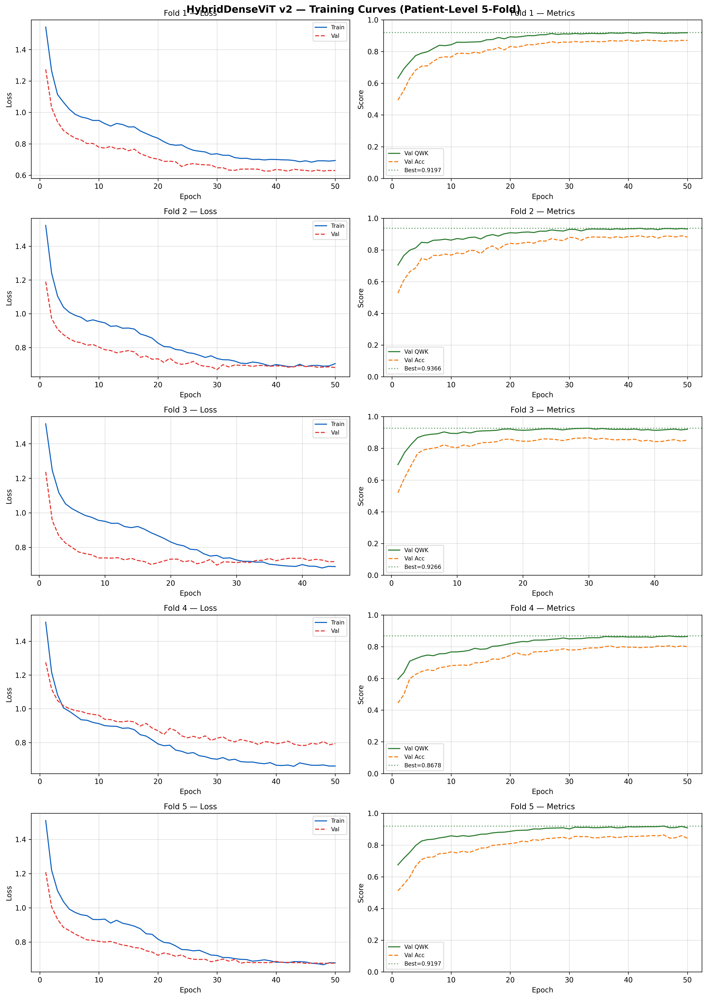

Fig 5 saved.


In [23]:
if SEASON == 2:
    # ============================================================
    # Fig 5 — HybridDenseViT training curves (per fold)
    # ============================================================
    
    fig, axes = plt.subplots(CFG.N_SPLITS, 2, figsize=(14, 4 * CFG.N_SPLITS))
    
    for fi, hist in enumerate(hybrid_histories):
        # epoch index
        ep = range(1, len(hist["tr_loss"]) + 1)
    
        # ---- Loss curves ----
        axes[fi, 0].plot(ep, hist["tr_loss"],
                         label="Train", color="#1565C0")
        axes[fi, 0].plot(ep, hist["val_loss"],
                         label="Val", color="#E53935", ls="--")
    
        axes[fi, 0].set_title(f"Fold {fi+1} — Loss", fontsize=11)
        axes[fi, 0].set_xlabel("Epoch")
        axes[fi, 0].set_ylabel("Loss")
        axes[fi, 0].legend(fontsize=8)
        axes[fi, 0].grid(True, alpha=0.4)
    
        # ---- Metric curves ----
        axes[fi, 1].plot(ep, hist["val_qwk"],
                         label="Val QWK", color="#2E7D32")
        axes[fi, 1].plot(ep, hist["val_acc"],
                         label="Val Acc", color="#F57F17", ls="--")
    
        bq = max(hist["val_qwk"])
        axes[fi, 1].axhline(bq, color="#2E7D32", ls=":", alpha=0.7,
                            label=f"Best={bq:.4f}")
    
        axes[fi, 1].set_title(f"Fold {fi+1} — Metrics", fontsize=11)
        axes[fi, 1].set_xlabel("Epoch")
        axes[fi, 1].set_ylabel("Score")
        axes[fi, 1].set_ylim(0, 1)
        axes[fi, 1].legend(fontsize=8)
        axes[fi, 1].grid(True, alpha=0.4)
    
    plt.suptitle(
        "HybridDenseViT v2 — Training Curves (Patient-Level 5-Fold)",
        fontsize=14, fontweight="bold"
    )
    plt.tight_layout()
    plt.savefig("fig5_training_curves.png", dpi=300, bbox_inches="tight")
    plt.show()
    print("Fig 5 saved.")

## Cell 21 — Statistical summary (reviewer fixes #4, #6)

In [24]:
if SEASON == 2:
    
    # ============================================================
    # Ablation summary + CI (requires abl_*_metrics lists)
    # ============================================================
    
    from scipy import stats as scipy_stats
    
    def ci95(vals):
        n = len(vals)
        if n < 2:
            # fallback for single-fold / debug runs
            return (vals[0], vals[0])
        ci = scipy_stats.t.interval(
            0.95, df=n - 1,
            loc=np.mean(vals),
            scale=scipy_stats.sem(vals)
        )
        return ci
    
    def summarise(metrics, name):
        qwks = [m["qwk"] for m in metrics]
        accs = [m["acc"] for m in metrics]
        q_ci = ci95(qwks)
        a_ci = ci95(accs)
        return {
            "Model": name,
            "QWK mean": f"{np.mean(qwks):.4f}",
            "QWK std":  f"{np.std(qwks):.4f}",
            "QWK 95%CI": f"[{q_ci[0]:.4f},{q_ci[1]:.4f}]",
            "Acc mean": f"{np.mean(accs):.4f}",
            "Acc std":  f"{np.std(accs):.4f}",
            "Acc 95%CI": f"[{a_ci[0]:.4f},{a_ci[1]:.4f}]"
        }
    
    # ---- build rows for table ----
    rows = [
        summarise(abl_dense_metrics, "DenseNet-121 Only (Baseline A)"),
        summarise(abl_vit_metrics,   "ViT-B/16 Only (Baseline B)"),
        summarise(hybrid_metrics,    "HybridDenseViT (Proposed)"),
    ]
    
    abl_df = pd.DataFrame(rows)
    
    print("\n" + "="*75)
    print("ABLATION STUDY — Patient-Level 5-Fold CV (MRI T2W)")
    print("="*75)
    print(abl_df.to_string(index=False))
    print("="*75)
    
    # ---- per-fold QWK arrays for plotting ----
    d_qwks = np.array([m["qwk"] for m in abl_dense_metrics], dtype=float)
    v_qwks = np.array([m["qwk"] for m in abl_vit_metrics],   dtype=float)
    h_qwks = np.array([m["qwk"] for m in hybrid_metrics],    dtype=float)
    
    d_accs = np.array([m["acc"] for m in abl_dense_metrics], dtype=float)
    v_accs = np.array([m["acc"] for m in abl_vit_metrics],   dtype=float)
    h_accs = np.array([m["acc"] for m in hybrid_metrics],    dtype=float)
    
    print("\nPer-fold QWK:")
    print(f"{'Fold':<6} {'DenseNet':>10} {'ViT':>10} {'Hybrid':>10}")
    for i in range(CFG.N_SPLITS):
        print(f"  {i+1:<4} {d_qwks[i]:>10.4f}"
              f" {v_qwks[i]:>10.4f}"
              f" {h_qwks[i]:>10.4f}")
    print(f"  {'Mean':<4} {np.mean(d_qwks):>10.4f} {np.mean(v_qwks):>10.4f} {np.mean(h_qwks):>10.4f}")
    print(f"  {'Std':<4} {np.std(d_qwks):>10.4f} {np.std(v_qwks):>10.4f} {np.std(h_qwks):>10.4f}")


ABLATION STUDY — Patient-Level 5-Fold CV (MRI T2W)
                         Model QWK mean QWK std       QWK 95%CI Acc mean Acc std       Acc 95%CI
DenseNet-121 Only (Baseline A)   0.8695  0.0296 [0.8284,0.9106]   0.7941  0.0338 [0.7473,0.8410]
    ViT-B/16 Only (Baseline B)   0.9056  0.0242 [0.8721,0.9391]   0.8447  0.0295 [0.8037,0.8857]
     HybridDenseViT (Proposed)   0.9141  0.0239 [0.8808,0.9473]   0.8596  0.0285 [0.8200,0.8991]

Per-fold QWK:
Fold     DenseNet        ViT     Hybrid
  1        0.8839     0.9152     0.9197
  2        0.8764     0.9261     0.9366
  3        0.9061     0.9202     0.9266
  4        0.8170     0.8588     0.8678
  5        0.8642     0.9076     0.9197
  Mean     0.8695     0.9056     0.9141
  Std      0.0296     0.0242     0.0239


## Cell 22 — Ablation figures (Fig 6 + Fig 7)

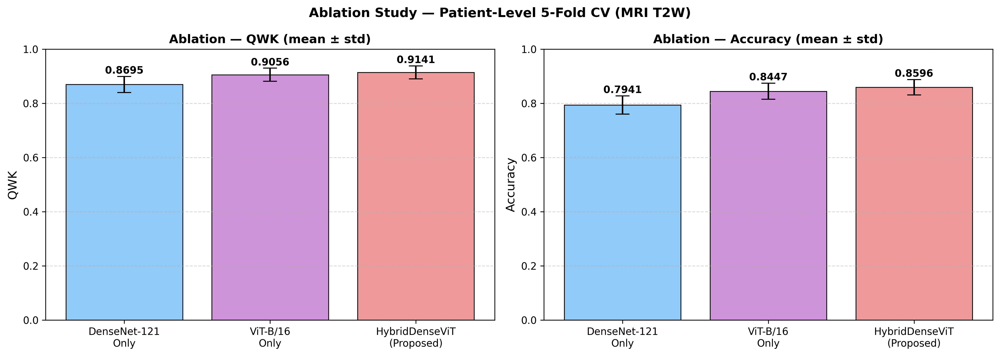

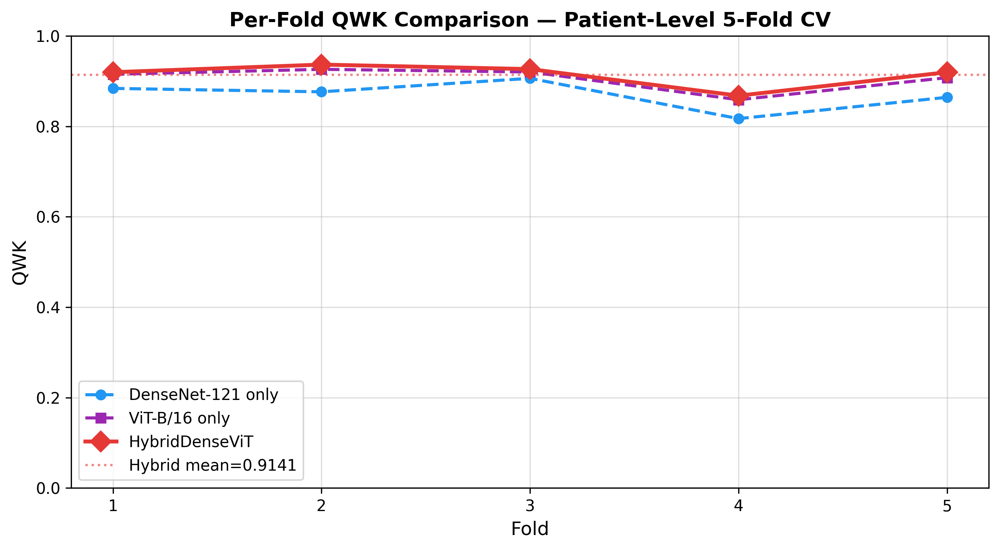

Fig 6 + 7 saved.


In [25]:
if SEASON == 2:


    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    mod_names  = ["DenseNet-121\nOnly", "ViT-B/16\nOnly", "HybridDenseViT\n(Proposed)"]
    bar_colors = ["#90CAF9","#CE93D8","#EF9A9A"]
    
    for ax, vals, stds, title in [
        (axes[0], [np.mean(d_qwks),np.mean(v_qwks),np.mean(h_qwks)],
                   [np.std(d_qwks), np.std(v_qwks), np.std(h_qwks)], "QWK"),
        (axes[1], [np.mean(d_accs),np.mean(v_accs),np.mean(h_accs)],
                   [np.std(d_accs), np.std(v_accs), np.std(h_accs)], "Accuracy"),
    ]:
        bars = ax.bar(mod_names, vals, yerr=stds, capsize=7,
                      color=bar_colors, edgecolor="black", lw=0.8)
        ax.set_ylim(0, 1.0); ax.set_ylabel(title, fontsize=12)
        ax.set_title(f"Ablation — {title} (mean ± std)", fontsize=12, fontweight="bold")
        ax.grid(axis="y", ls="--", alpha=0.5)
        for bar, m, s in zip(bars, vals, stds):
            ax.text(bar.get_x()+bar.get_width()/2, m+s+0.01,
                    f"{m:.4f}", ha="center", fontsize=10, fontweight="bold")
    
    plt.suptitle("Ablation Study — Patient-Level 5-Fold CV (MRI T2W)",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("fig6_ablation_bars.png", dpi=300, bbox_inches="tight")
    plt.show()
    
    # Per-fold line plot
    folds_x = list(range(1, CFG.N_SPLITS+1))
    plt.figure(figsize=(9,5))
    plt.plot(folds_x, d_qwks, "o--", color="#2196F3", lw=2, label="DenseNet-121 only")
    plt.plot(folds_x, v_qwks, "s--", color="#9C27B0", lw=2, label="ViT-B/16 only")
    plt.plot(folds_x, h_qwks, "D-",  color="#E53935", lw=2.5, ms=9, label="HybridDenseViT")
    plt.axhline(np.mean(h_qwks), color="#E53935", ls=":", alpha=0.6,
                label=f"Hybrid mean={np.mean(h_qwks):.4f}")
    plt.xlabel("Fold",fontsize=12); plt.ylabel("QWK",fontsize=12)
    plt.title("Per-Fold QWK Comparison — Patient-Level 5-Fold CV",
              fontsize=13, fontweight="bold")
    plt.xticks(folds_x); plt.ylim(0,1.0)
    plt.legend(fontsize=10); plt.grid(True, alpha=0.4)
    plt.tight_layout()
    plt.savefig("fig7_per_fold_qwk.png", dpi=300, bbox_inches="tight")
    plt.show(); print("Fig 6 + 7 saved.")


In [26]:
## Cell 22b — McNemar's test (pairwise model comparison)

from statsmodels.stats.contingency_tables import mcnemar

if SEASON == 2:
    print("="*60)
    print("McNEMAR'S TEST — Pairwise Model Comparison (paired OOF preds)")
    print("="*60)

    labels_ref = np.array(abl_dense_oof_labels)  # true labels, same order for all 3 models

    def mcnemar_pair(name_a, preds_a, name_b, preds_b, labels):
        preds_a = np.array(preds_a); preds_b = np.array(preds_b)
        assert len(preds_a) == len(preds_b) == len(labels), \
            f"Length mismatch: {name_a}={len(preds_a)} {name_b}={len(preds_b)} labels={len(labels)}"

        correct_a = (preds_a == labels)
        correct_b = (preds_b == labels)

        # Contingency table:
        #            B correct   B wrong
        # A correct     n11        n10
        # A wrong       n01        n00
        n11 = np.sum(correct_a & correct_b)
        n10 = np.sum(correct_a & ~correct_b)
        n01 = np.sum(~correct_a & correct_b)
        n00 = np.sum(~correct_a & ~correct_b)
        table = [[n11, n10], [n01, n00]]

        exact = (n10 + n01) < 25
        result = mcnemar(table, exact=exact, correction=True)

        sig = "significant (p<0.05)" if result.pvalue < 0.05 else "not significant"
        print(f"\n  {name_a} vs {name_b}")
        print(f"    Discordant pairs: {name_a} only correct={n10}, {name_b} only correct={n01}")
        print(f"    statistic={result.statistic:.4f}  p-value={result.pvalue:.4f}  → {sig}")
        return result.pvalue

    p_hd = mcnemar_pair("HybridDenseViT", hybrid_oof_preds, "DenseNet-121", abl_dense_oof_preds, labels_ref)
    p_hv = mcnemar_pair("HybridDenseViT", hybrid_oof_preds, "ViT-B/16",     abl_vit_oof_preds,   labels_ref)
    p_dv = mcnemar_pair("DenseNet-121",   abl_dense_oof_preds, "ViT-B/16",  abl_vit_oof_preds,   labels_ref)

    mcnemar_df = pd.DataFrame([
        {"Comparison": "Hybrid vs DenseNet-121", "p-value": p_hd, "Significant (p<0.05)": p_hd < 0.05},
        {"Comparison": "Hybrid vs ViT-B/16",     "p-value": p_hv, "Significant (p<0.05)": p_hv < 0.05},
        {"Comparison": "DenseNet-121 vs ViT-B/16","p-value": p_dv, "Significant (p<0.05)": p_dv < 0.05},
    ])
    print("\n" + "="*60)
    print(mcnemar_df.to_string(index=False))
    print("="*60)
else:
    print("Skipped — McNemar's test needs Hybrid results (Season 2 only).")

McNEMAR'S TEST — Pairwise Model Comparison (paired OOF preds)

  HybridDenseViT vs DenseNet-121
    Discordant pairs: HybridDenseViT only correct=776, DenseNet-121 only correct=320
    statistic=188.8914  p-value=0.0000  → significant (p<0.05)

  HybridDenseViT vs ViT-B/16
    Discordant pairs: HybridDenseViT only correct=248, ViT-B/16 only correct=144
    statistic=27.0638  p-value=0.0000  → significant (p<0.05)

  DenseNet-121 vs ViT-B/16
    Discordant pairs: DenseNet-121 only correct=471, ViT-B/16 only correct=823
    statistic=95.2094  p-value=0.0000  → significant (p<0.05)

              Comparison      p-value  Significant (p<0.05)
  Hybrid vs DenseNet-121 5.550256e-43                  True
      Hybrid vs ViT-B/16 1.968524e-07                  True
DenseNet-121 vs ViT-B/16 1.712726e-22                  True


## Cell 23 — OOF metrics + specificity

In [27]:
if SEASON == 2:


    oof_acc = accuracy_score(hybrid_oof_labels, hybrid_oof_preds)
    oof_qwk = cohen_kappa_score(hybrid_oof_labels, hybrid_oof_preds, weights="quadratic")
    cm_all  = confusion_matrix(hybrid_oof_labels, hybrid_oof_preds)
    h_ci    = ci95(h_qwks)
    a_ci    = ci95(h_accs)
    
    print("="*60)
    print("PROPOSED MODEL — OOF Results (Patient-Level 5-Fold)")
    print("="*60)
    print(f"  OOF QWK      : {oof_qwk:.4f}")
    print(f"  QWK mean±std : {np.mean(h_qwks):.4f} ± {np.std(h_qwks):.4f}")
    print(f"  QWK 95% CI   : [{h_ci[0]:.4f}, {h_ci[1]:.4f}]")
    print(f"  OOF Accuracy : {oof_acc:.4f}")
    print(f"  Acc mean±std : {np.mean(h_accs):.4f} ± {np.std(h_accs):.4f}")
    print(f"  Acc 95% CI   : [{a_ci[0]:.4f}, {a_ci[1]:.4f}]")
    print()
    print(classification_report(hybrid_oof_labels, hybrid_oof_preds,
                                 target_names=list(class_map.keys()), digits=4))
    print("Specificity per class:")
    for i, cls in enumerate(class_map.keys()):
        tn = cm_all.sum() - (cm_all[i].sum() + cm_all[:,i].sum() - cm_all[i,i])
        fp = cm_all[:,i].sum() - cm_all[i,i]
        spec = tn/(tn+fp) if (tn+fp)>0 else 1.0
        print(f"  {cls}: {spec:.4f}")


PROPOSED MODEL — OOF Results (Patient-Level 5-Fold)
  OOF QWK      : 0.9154
  QWK mean±std : 0.9141 ± 0.0239
  QWK 95% CI   : [0.8808, 0.9473]
  OOF Accuracy : 0.8599
  Acc mean±std : 0.8596 ± 0.0285
  Acc 95% CI   : [0.8200, 0.8991]

              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       859
          F1     0.8816    0.8630    0.8722      2614
          F2     0.7733    0.8030    0.7879      2239
          F3     0.8804    0.8586    0.8694      1252

    accuracy                         0.8599      6964
   macro avg     0.8838    0.8812    0.8824      6964
weighted avg     0.8612    0.8599    0.8604      6964

Specificity per class:
  F0: 1.0000
  F1: 0.9303
  F2: 0.8885
  F3: 0.9744


In [28]:
if SEASON == 2:


    # ── TEST-TIME AUGMENTATION (TTA) ─────────────────────────────────────────────
    # Averages predictions over 5 augmented versions → typically +3-5% QWK
    
    tta_tfms = [
        A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
                   A.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
                   ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
                   A.Rotate(limit=5, p=1.0),
                   A.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
                   ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
                   A.Rotate(limit=-5, p=1.0),
                   A.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
                   ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
                   A.ShiftScaleRotate(shift_limit=0.03, scale_limit=0.0,
                                      rotate_limit=0, p=1.0),
                   A.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
                   ToTensorV2()]),
        A.Compose([A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
                   A.ShiftScaleRotate(shift_limit=0.0, scale_limit=0.05,
                                      rotate_limit=0, p=1.0),
                   A.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
                   ToTensorV2()]),
    ]
    
    def predict_with_tta(model, img_path):
        """Run all TTA transforms and return averaged probability vector."""
        img = preprocess_for_model(img_path)
        if img is None:
            return np.ones(CFG.NUM_CLASSES) / CFG.NUM_CLASSES
        probs_list = []
        model.eval()
        with torch.no_grad():
            for tfm in tta_tfms:
                inp = tfm(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)
                with autocast():
                    out = model(inp)
                probs_list.append(F.softmax(out, dim=1).cpu().numpy()[0])
        return np.mean(probs_list, axis=0)
    
    
    print("Running TTA on OOF validation sets (5 folds)...")
    tta_oof_probs  = []
    tta_oof_labels = []
    tta_oof_preds  = []
    
    for fold, (_, valid_idx) in enumerate(splits):
        ckpt = f"hybrid_fold{fold+1}_best.pth"
        if not os.path.exists(ckpt):
            print(f"  WARNING: {ckpt} not found — skipping"); continue
    
        gc.collect(); torch.cuda.empty_cache()
        mdl = HybridDenseViT().to(CFG.DEVICE)
        mdl.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        mdl.eval()
    
        valid_df   = df.iloc[valid_idx].reset_index(drop=True)
        fold_probs, fold_labels_list = [], []
    
        for _, row in tqdm(valid_df.iterrows(), total=len(valid_df),
                           desc=f"TTA Fold {fold+1}", leave=False):
            prob = predict_with_tta(mdl, row.image_path)
            fold_probs.append(prob)
            fold_labels_list.append(row.diagnosis)
    
        fold_probs  = np.array(fold_probs)
        fold_labels_arr = np.array(fold_labels_list)
        fold_preds  = np.argmax(fold_probs, axis=1)
    
        tta_oof_probs.extend(fold_probs)
        tta_oof_labels.extend(fold_labels_list)
        tta_oof_preds.extend(fold_preds)
    
        fold_qwk = cohen_kappa_score(fold_labels_arr, fold_preds, weights="quadratic")
        fold_acc  = accuracy_score(fold_labels_arr, fold_preds)
        print(f"  Fold {fold+1} TTA → QWK={fold_qwk:.4f}  Acc={fold_acc:.4f}"
              f"  (no-TTA: QWK={hybrid_metrics[fold]['qwk']:.4f}"
              f"  Acc={hybrid_metrics[fold]['acc']:.4f})")
        del mdl; gc.collect(); torch.cuda.empty_cache()
    
    tta_oof_labels = np.array(tta_oof_labels)
    tta_oof_preds  = np.array(tta_oof_preds)
    tta_oof_probs  = np.array(tta_oof_probs)
    tta_cm         = confusion_matrix(tta_oof_labels, tta_oof_preds)
    
    tta_qwk = cohen_kappa_score(tta_oof_labels, tta_oof_preds, weights="quadratic")
    tta_acc  = accuracy_score(tta_oof_labels, tta_oof_preds)
    tta_h_ci = ci95([cohen_kappa_score(
                        tta_oof_labels[splits[f][1]],
                        tta_oof_preds[splits[f][1]], weights="quadratic")
                     for f in range(CFG.N_SPLITS)
                     if os.path.exists(f"hybrid_fold{f+1}_best.pth")])
    
    print(f"\n{'='*58}")
    print(f"TTA FINAL RESULTS  (patient-level 5-fold OOF)")
    print(f"{'='*58}")
    print(f"  No-TTA  QWK : {oof_qwk:.4f}  |  Acc : {oof_acc:.4f}")
    print(f"  TTA     QWK : {tta_qwk:.4f}  |  Acc : {tta_acc:.4f}")
    print(f"  QWK gain    : {tta_qwk - oof_qwk:+.4f}")
    print(f"  Acc gain    : {tta_acc - oof_acc:+.4f}")
    print(f"  TTA QWK 95% CI : [{tta_h_ci[0]:.4f}, {tta_h_ci[1]:.4f}]")
    print()
    print(classification_report(tta_oof_labels, tta_oof_preds,
                                 target_names=list(class_map.keys()), digits=4))
    
    print("Specificity per class (TTA):")
    for i, cls in enumerate(class_map.keys()):
        tn = tta_cm.sum() - (tta_cm[i].sum() + tta_cm[:,i].sum() - tta_cm[i,i])
        fp = tta_cm[:,i].sum() - tta_cm[i,i]
        spec = tn/(tn+fp) if (tn+fp)>0 else 1.0
        print(f"  {cls}: {spec:.4f}")

Running TTA on OOF validation sets (5 folds)...


  Fold 1 TTA → QWK=0.9225  Acc=0.8770  (no-TTA: QWK=0.9197  Acc=0.8726)


  Fold 2 TTA → QWK=0.9377  Acc=0.8939  (no-TTA: QWK=0.9366  Acc=0.8897)


  Fold 3 TTA → QWK=0.9304  Acc=0.8712  (no-TTA: QWK=0.9266  Acc=0.8663)


  Fold 4 TTA → QWK=0.8692  Acc=0.8048  (no-TTA: QWK=0.8678  Acc=0.8056)


  Fold 5 TTA → QWK=0.9241  Acc=0.8714  (no-TTA: QWK=0.9197  Acc=0.8636)

TTA FINAL RESULTS  (patient-level 5-fold OOF)
  No-TTA  QWK : 0.9154  |  Acc : 0.8599
  TTA     QWK : 0.9182  |  Acc : 0.8640
  QWK gain    : +0.0028
  Acc gain    : +0.0042
  TTA QWK 95% CI : [0.9104, 0.9259]

              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       859
          F1     0.8881    0.8588    0.8732      2614
          F2     0.7743    0.8182    0.7957      2239
          F3     0.8927    0.8634    0.8778      1252

    accuracy                         0.8640      6964
   macro avg     0.8888    0.8851    0.8867      6964
weighted avg     0.8661    0.8640    0.8647      6964

Specificity per class (TTA):
  F0: 1.0000
  F1: 0.9349
  F2: 0.8870
  F3: 0.9772


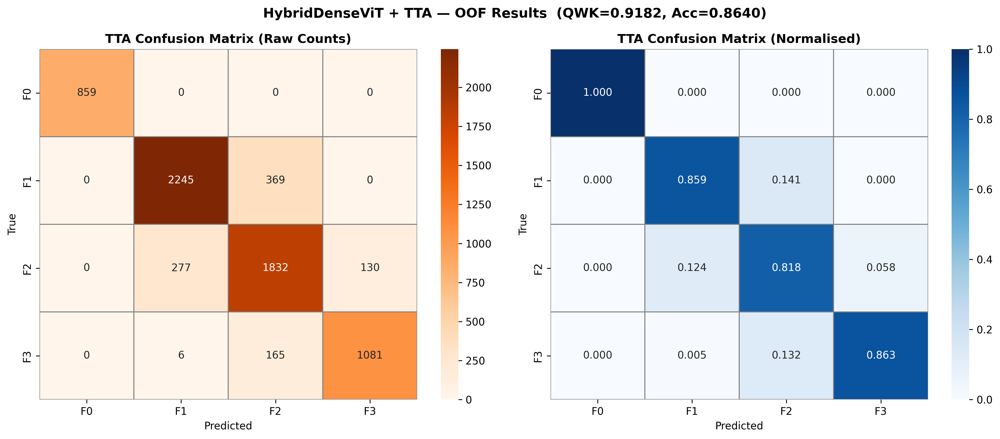

Fig 8b (TTA confusion matrices) saved at 300 DPI.


In [29]:
if SEASON == 2:


    # ── Fig 8b: TTA Confusion matrices ───────────────────────────────────────────
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    cls_names = list(class_map.keys())
    
    sns.heatmap(tta_cm, annot=True, fmt="d", cmap="Oranges", ax=axes[0],
                xticklabels=cls_names, yticklabels=cls_names,
                linewidths=0.5, linecolor="gray")
    axes[0].set_title("TTA Confusion Matrix (Raw Counts)", fontsize=12, fontweight="bold")
    axes[0].set_xlabel("Predicted"); axes[0].set_ylabel("True")
    
    tta_cm_norm = tta_cm.astype(float) / tta_cm.sum(axis=1, keepdims=True)
    sns.heatmap(tta_cm_norm, annot=True, fmt=".3f", cmap="Blues", ax=axes[1],
                xticklabels=cls_names, yticklabels=cls_names,
                linewidths=0.5, linecolor="gray")
    axes[1].set_title("TTA Confusion Matrix (Normalised)", fontsize=12, fontweight="bold")
    axes[1].set_xlabel("Predicted"); axes[1].set_ylabel("True")
    
    plt.suptitle(
        f"HybridDenseViT + TTA — OOF Results  (QWK={tta_qwk:.4f}, Acc={tta_acc:.4f})",
        fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("fig8b_tta_confusion_matrices.png", dpi=300, bbox_inches="tight")
    plt.show()
    print("Fig 8b (TTA confusion matrices) saved at 300 DPI.")

## Cell 24 — Confusion matrices (Fig 8)

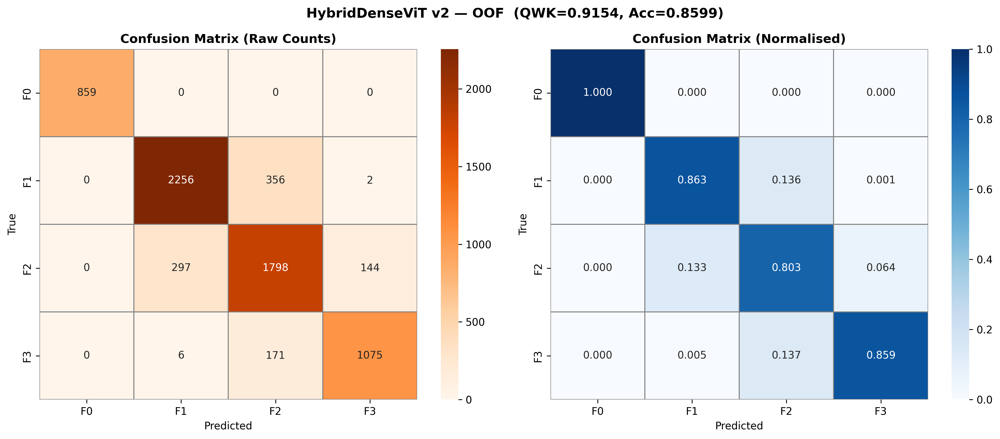

Fig 8 saved.


In [30]:
if SEASON == 2:

    fig, axes = plt.subplots(1,2,figsize=(14,6))
    cls_names = list(class_map.keys())
    
    sns.heatmap(cm_all, annot=True, fmt="d", cmap="Oranges", ax=axes[0],
                xticklabels=cls_names, yticklabels=cls_names, lw=0.5, linecolor="gray")
    axes[0].set_title("Confusion Matrix (Raw Counts)", fontsize=12, fontweight="bold")
    axes[0].set_xlabel("Predicted"); axes[0].set_ylabel("True")
    
    cm_norm = cm_all.astype(float)/cm_all.sum(axis=1, keepdims=True)
    sns.heatmap(cm_norm, annot=True, fmt=".3f", cmap="Blues", ax=axes[1],
                xticklabels=cls_names, yticklabels=cls_names, lw=0.5, linecolor="gray")
    axes[1].set_title("Confusion Matrix (Normalised)", fontsize=12, fontweight="bold")
    axes[1].set_xlabel("Predicted"); axes[1].set_ylabel("True")
    
    plt.suptitle(f"HybridDenseViT v2 — OOF  (QWK={oof_qwk:.4f}, Acc={oof_acc:.4f})",
                 fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("fig8_confusion_matrices.png", dpi=300, bbox_inches="tight")
    plt.show(); print("Fig 8 saved.")


## Cell 25 — OOF probabilities for ROC

In [31]:
if SEASON == 2:

    print("Collecting OOF probabilities...")
    hybrid_oof_probs = []
    
    for fold, (_, valid_idx) in enumerate(splits):
        ckpt = f"hybrid_fold{fold+1}_best.pth"
        if not os.path.exists(ckpt):
            print(f"  WARNING: {ckpt} not found"); continue
        valid_ds = LiverDataset(df.iloc[valid_idx], transform=valid_tfms)
        valid_ld = DataLoader(valid_ds, batch_size=CFG.BATCH_SIZE,
                              shuffle=False, num_workers=2)
        gc.collect(); torch.cuda.empty_cache()
        mdl = HybridDenseViT().to(CFG.DEVICE)
        mdl.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        mdl.eval()
        with torch.no_grad():
            for imgs, _ in tqdm(valid_ld, desc=f"Fold {fold+1}", leave=False):
                probs = F.softmax(mdl(imgs.to(CFG.DEVICE)), dim=1).cpu().numpy()
                hybrid_oof_probs.extend(probs)
        del mdl; gc.collect(); torch.cuda.empty_cache()
    
    hybrid_oof_probs_np = np.array(hybrid_oof_probs)
    print(f"Shape: {hybrid_oof_probs_np.shape}")


Shape: (6964, 4)


## Cell 26 — ROC / AUC (Fig 9)

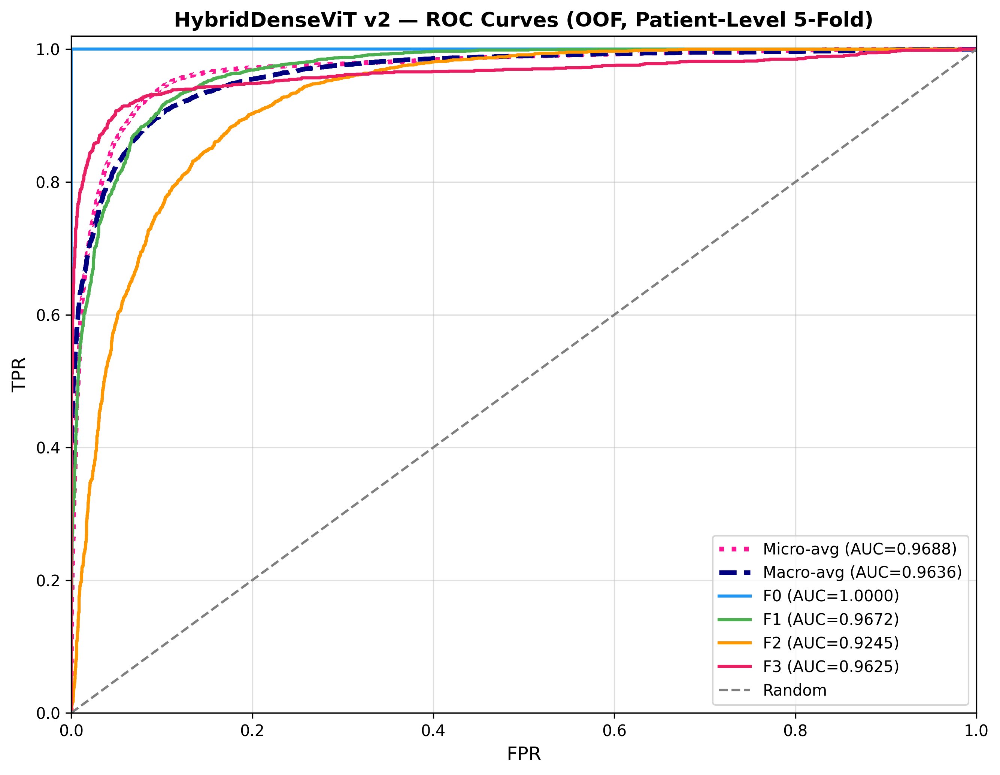

Fig 9 saved.


In [32]:
if SEASON == 2:
    
    y_bin = label_binarize(hybrid_oof_labels, classes=list(range(CFG.NUM_CLASSES)))
    fpr, tpr, roc_auc = {},{},{}
    for i in range(CFG.NUM_CLASSES):
        fpr[i],tpr[i],_ = roc_curve(y_bin[:,i], hybrid_oof_probs_np[:,i])
        roc_auc[i]       = auc(fpr[i],tpr[i])
    fpr["micro"],tpr["micro"],_ = roc_curve(y_bin.ravel(), hybrid_oof_probs_np.ravel())
    roc_auc["micro"] = auc(fpr["micro"],tpr["micro"])
    all_fpr  = np.unique(np.concatenate([fpr[i] for i in range(CFG.NUM_CLASSES)]))
    mean_tpr = np.mean([np.interp(all_fpr,fpr[i],tpr[i]) for i in range(CFG.NUM_CLASSES)],axis=0)
    fpr["macro"],tpr["macro"] = all_fpr,mean_tpr
    roc_auc["macro"] = auc(fpr["macro"],tpr["macro"])
    
    plt.figure(figsize=(9,7))
    plt.plot(fpr["micro"],tpr["micro"],color="deeppink",lw=3,ls=":",
             label=f"Micro-avg (AUC={roc_auc['micro']:.4f})")
    plt.plot(fpr["macro"],tpr["macro"],color="navy",lw=3,ls="--",
             label=f"Macro-avg (AUC={roc_auc['macro']:.4f})")
    for i,col in zip(range(CFG.NUM_CLASSES),cycle(["#2196F3","#4CAF50","#FF9800","#E91E63"])):
        plt.plot(fpr[i],tpr[i],color=col,lw=2,label=f"F{i} (AUC={roc_auc[i]:.4f})")
    plt.plot([0,1],[0,1],"--",color="gray",lw=1.5,label="Random")
    plt.xlim([0,1]); plt.ylim([0,1.02])
    plt.xlabel("FPR",fontsize=12); plt.ylabel("TPR",fontsize=12)
    plt.title("HybridDenseViT v2 — ROC Curves (OOF, Patient-Level 5-Fold)",
              fontsize=13,fontweight="bold")
    plt.legend(loc="lower right",fontsize=10); plt.grid(True,alpha=0.4)
    plt.tight_layout()
    plt.savefig("fig9_roc_curves.png", dpi=300, bbox_inches="tight")
    plt.show(); print("Fig 9 saved.")


## Patient-Level Error Analysis

Majority vote over slices per patient. Shows patient confusion matrix and table of wrong predictions.

PATIENT-LEVEL EVALUATION (majority vote over slices)
  Total patients: 305
  Correct       : 277 / 305
  Patient Acc   : 0.9082
  Patient QWK   : 0.9406

Per-class patient accuracy:
  F0:  22/ 22 correct (100.0%)
  F1: 108/114 correct (94.7%)
  F2:  90/105 correct (85.7%)
  F3:  57/ 64 correct (89.1%)


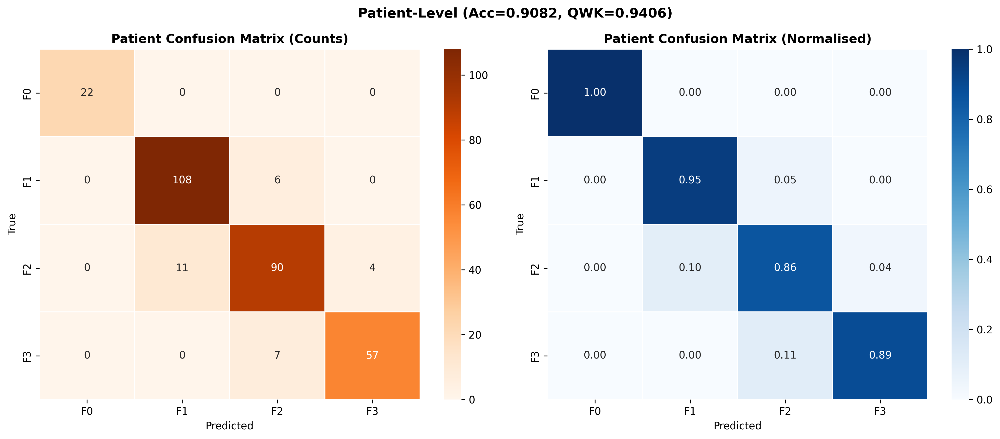

Patient confusion matrix saved.

WRONG PREDICTIONS — 28 patients misclassified
Patient ID       True    Predicted   Slices  Slice Acc
-------------------------------------------------------
  patient_111           F1 -> F2             19   (37%)
  patient_115           F1 -> F2             22   (41%)
  patient_401           F1 -> F2             20   (45%)
  patient_406           F1 -> F2             23   (35%)
  patient_91            F1 -> F2             27   (26%)
  patient_96            F1 -> F2             20   (5%)
  patient_141           F2 -> F1             19   (26%)
  patient_161           F2 -> F1             19   (0%)
  patient_177           F2 -> F1             23   (48%)
  patient_178           F2 -> F1             28   (46%)
  patient_280           F2 -> F1             27   (41%)
  patient_284           F2 -> F1             25   (48%)
  patient_287           F2 -> F1             16   (38%)
  patient_307           F2 -> F1             21   (33%)
  patient_381           F2 -

In [33]:
if SEASON == 2:


    cls_names = list(class_map.keys())
    
    oof_result_rows = []
    offset = 0
    for fold, (_, val_idx) in enumerate(splits):
        val_df     = df.iloc[val_idx].reset_index(drop=True)
        fold_size  = len(val_idx)
        fold_labels = hybrid_oof_labels[offset:offset+fold_size]
        fold_preds  = hybrid_oof_preds[offset:offset+fold_size]
        for j in range(fold_size):
            oof_result_rows.append({
                "patient_id": val_df.iloc[j]["patient_id"],
                "true_label": int(fold_labels[j]),
                "pred_label": int(fold_preds[j]),
                "true_class": cls_names[int(fold_labels[j])],
                "pred_class": cls_names[int(fold_preds[j])],
                "correct"   : fold_labels[j] == fold_preds[j],
            })
        offset += fold_size
    
    slice_results = pd.DataFrame(oof_result_rows)
    
    patient_results = []
    for pid, grp in slice_results.groupby("patient_id"):
        true_label = grp["true_label"].mode()[0]
        pred_label = grp["pred_label"].mode()[0]
        n_slices   = len(grp)
        n_correct  = grp["correct"].sum()
        patient_results.append({
            "patient_id" : pid,
            "true_class" : cls_names[true_label],
            "pred_class" : cls_names[pred_label],
            "true_label" : true_label,
            "pred_label" : pred_label,
            "correct"    : true_label == pred_label,
            "n_slices"   : n_slices,
            "slice_acc"  : n_correct / n_slices,
        })
    
    patient_df = pd.DataFrame(patient_results).sort_values(["true_label","patient_id"]).reset_index(drop=True)
    pat_acc = patient_df["correct"].mean()
    pat_qwk = cohen_kappa_score(patient_df["true_label"], patient_df["pred_label"], weights="quadratic")
    
    print("="*60)
    print("PATIENT-LEVEL EVALUATION (majority vote over slices)")
    print("="*60)
    print(f"  Total patients: {len(patient_df)}")
    print(f"  Correct       : {patient_df['correct'].sum()} / {len(patient_df)}")
    print(f"  Patient Acc   : {pat_acc:.4f}")
    print(f"  Patient QWK   : {pat_qwk:.4f}")
    print()
    print("Per-class patient accuracy:")
    for cls in cls_names:
        grp = patient_df[patient_df["true_class"]==cls]
        acc = grp["correct"].mean() if len(grp) > 0 else 0
        print(f"  {cls}: {grp['correct'].sum():3d}/{len(grp):3d} correct ({acc:.1%})")
    
    pat_cm = confusion_matrix(patient_df["true_label"], patient_df["pred_label"])
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    sns.heatmap(pat_cm, annot=True, fmt="d", cmap="Oranges", ax=axes[0],
                xticklabels=cls_names, yticklabels=cls_names, linewidths=0.5)
    axes[0].set_title("Patient Confusion Matrix (Counts)", fontsize=12, fontweight="bold")
    axes[0].set_xlabel("Predicted"); axes[0].set_ylabel("True")
    pat_cm_n = pat_cm.astype(float) / pat_cm.sum(axis=1, keepdims=True)
    sns.heatmap(pat_cm_n, annot=True, fmt=".2f", cmap="Blues", ax=axes[1],
                xticklabels=cls_names, yticklabels=cls_names, linewidths=0.5)
    axes[1].set_title("Patient Confusion Matrix (Normalised)", fontsize=12, fontweight="bold")
    axes[1].set_xlabel("Predicted"); axes[1].set_ylabel("True")
    plt.suptitle(f"Patient-Level (Acc={pat_acc:.4f}, QWK={pat_qwk:.4f})", fontsize=13, fontweight="bold")
    plt.tight_layout()
    plt.savefig("fig_patient_confusion.png", dpi=300, bbox_inches="tight")
    plt.show()
    print("Patient confusion matrix saved.")
    
    wrong_df = patient_df[~patient_df["correct"]].sort_values(["true_label","pred_label"])
    print(f"\n{'='*65}")
    print(f"WRONG PREDICTIONS — {len(wrong_df)} patients misclassified")
    print(f"{'='*65}")
    print(f"{'Patient ID':<15} {'True':>5} {'Predicted':>12} {'Slices':>8} {'Slice Acc':>10}")
    print("-"*55)
    for _, r in wrong_df.iterrows():
        print(f"  patient_{r['patient_id']:<10} {r['true_class']:>5} -> {r['pred_class']:<10} "
              f"{r['n_slices']:>6}   ({r['slice_acc']:.0%})")
    
    print(f"\nMisclassification summary:")
    for t in cls_names:
        for p in cls_names:
            if t != p:
                n = ((wrong_df["true_class"]==t)&(wrong_df["pred_class"]==p)).sum()
                if n > 0:
                    print(f"  True {t} -> Pred {p}: {n} patients")
    
    wrong_df[["patient_id","true_class","pred_class","n_slices","slice_acc"]].to_csv(
        "wrong_predictions.csv", index=False)
    print("\nSaved: wrong_predictions.csv")

## Cell 27 — XAI: LayerCAM + Attention Rollout (Fig 10)

**Reviewer fix #7:** Attention Rollout for ViT branch (LayerCAM unreliable on transformers).

In [34]:
if SEASON == 2:

    import math
    import cv2
    import torch
    import torch.nn.functional as F
    import numpy as np
    import matplotlib.pyplot as plt
    
    # --- Fixed Attention Maps & Rollout Functions ---
    
    def get_attention_maps(vit_model, img_tensor):
        """
        Extracts attention weights across all ViT block attention layers.
        Uses PyTorch forward hooks to avoid signature conflicts with timm keyword arguments.
        """
        attention_maps = []
        hooks = []
    
        def hook_fn(module, input, output):
            # input[0] shape: (B, N, C)
            x = input[0]
            B, N, C = x.shape
            num_heads = module.num_heads
            head_dim = C // num_heads
            
            # Calculate Q & K projection to compute raw attention matrix
            qkv = module.qkv(x).reshape(B, N, 3, num_heads, head_dim)
            qkv = qkv.permute(2, 0, 3, 1, 4)
            q, k, _ = qkv.unbind(0)
            
            scale = head_dim ** -0.5
            attn = (q @ k.transpose(-2, -1)) * scale
            attn = attn.softmax(dim=-1)
            
            attention_maps.append(attn.detach().cpu())
    
        # Attach forward hooks to all attention modules
        for blk in vit_model.blocks:
            hooks.append(blk.attn.register_forward_hook(hook_fn))
    
        vit_model.eval()
        with torch.no_grad():
            _ = vit_model(img_tensor)
    
        # Clean up hooks
        for hook in hooks:
            hook.remove()
    
        return attention_maps
    
    
    def attention_rollout(vit_model, img_tensor):
        maps = get_attention_maps(vit_model, img_tensor)
        if len(maps) == 0:
            print("  WARNING: No attention maps — uniform fallback")
            return np.ones((CFG.IMG_SIZE, CFG.IMG_SIZE), dtype=np.float32) * 0.5
            
        result = torch.eye(maps[0].shape[-1])
        for attn in maps:
            avg = attn.mean(dim=1).squeeze(0)
            aug = avg + torch.eye(avg.size(0))
            aug = aug / aug.sum(dim=-1, keepdim=True)
            result = torch.matmul(aug, result)
            
        mask = result[0, 1:]
        n = int(mask.shape[0] ** 0.5)
        mask = mask.reshape(n, n).numpy()
        mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
        return cv2.resize(mask, (CFG.IMG_SIZE, CFG.IMG_SIZE))
    
    
    # --- Verification & Model Loading ---
    
    xai_model = HybridDenseViT().to(CFG.DEVICE)
    xai_model.load_state_dict(torch.load("hybrid_fold1_best.pth", map_location=CFG.DEVICE))
    xai_model.eval()
    
    test_inp = torch.zeros(1, 3, CFG.IMG_SIZE, CFG.IMG_SIZE).to(CFG.DEVICE)
    test_map = attention_rollout(xai_model.vit, test_inp)
    print(f"Attention rollout test: range={test_map.max()-test_map.min():.4f}")
    if test_map.max() - test_map.min() < 0.01:
        print("  WARNING: map near-uniform")
    else:
        print("  Attention rollout working correctly")
    
    # --- XAI Visualization Generation ---
    
    cam_cnn = LayerCAM(model=xai_model, target_layers=[xai_model.cnn.features.norm5])
    
    cls_names = list(class_map.keys())
    fig, axes = plt.subplots(CFG.NUM_CLASSES, 4, figsize=(24, 6 * CFG.NUM_CLASSES))
    col_titles = [
        "Original Image",
        "Preprocessed (Model Input)",
        "DenseNet-121 LayerCAM\n(Local Texture Features)",
        "ViT-B/16 Attention Rollout\n(Global Structure Features)"
    ]
    
    for ci in range(CFG.NUM_CLASSES):
        row = df[df["diagnosis"] == ci].sample(1, random_state=ci * 7).iloc[0]
        path = row.image_path
        orig = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        orig = cv2.resize(orig, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        prep = preprocess_for_model(path)
        if prep is None:
            prep = orig.copy()
        prep = cv2.resize(prep, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        flt = np.clip(prep.astype(np.float32) / 255.0, 0, 1)
        inp = valid_tfms(image=prep)["image"].unsqueeze(0).to(CFG.DEVICE)
    
        with torch.no_grad():
            out = xai_model(inp)
            probs = F.softmax(out, dim=1).cpu().numpy()[0]
            pred = int(np.argmax(probs))
            conf = float(probs[pred])
    
        try:
            gcam = cam_cnn(input_tensor=inp, targets=[ClassifierOutputTarget(pred)])[0]
            hm_cnn = show_cam_on_image(flt, gcam, use_rgb=True)
        except Exception as e:
            print(f"  LayerCAM error F{ci}: {e}")
            hm_cnn = orig.copy()
    
        rollout = attention_rollout(xai_model.vit, inp)
        hm_vit = show_cam_on_image(flt, rollout, use_rgb=True)
    
        correct_str = "CORRECT" if pred == ci else f"WRONG (Pred: F{pred})"
        color = "green" if pred == ci else "red"
    
        for col_i, (ax, img, t) in enumerate(zip(axes[ci], [orig, prep, hm_cnn, hm_vit], col_titles)):
            ax.imshow(img, cmap="gray" if img.ndim == 2 else None)
            if ci == 0:
                ax.set_title(t, fontsize=11, fontweight="bold", pad=10)
            ax.axis("off")
    
        label_text = (
            f"True: {cls_names[ci]}\n"
            f"Pred: {cls_names[pred]} ({conf:.1%})\n"
            f"{correct_str}\n"
            f"[{probs[0]:.2f},{probs[1]:.2f},{probs[2]:.2f},{probs[3]:.2f}]"
        )
        axes[ci][0].set_ylabel(
            label_text,
            fontsize=9,
            rotation=0,
            labelpad=140,
            va="center",
            color=color,
            fontweight="bold"
        )
    
    plt.suptitle(
        "XAI: LayerCAM (DenseNet-121) + Attention Rollout (ViT-B/16)\n"
        "Reviewer fix #7: Attention Rollout for ViT branch",
        fontsize=13,
        fontweight="bold",
        y=1.01
    )
    plt.tight_layout()
    plt.savefig("fig10_xai.png", dpi=300, bbox_inches="tight")
    plt.show()
    print("Fig 10 (XAI) saved at 300 DPI.")

Attention rollout test: range=0.9600
  Attention rollout working correctly


Fig 10 (XAI) saved at 300 DPI.


XAI Inference: 5 model(s) loaded.


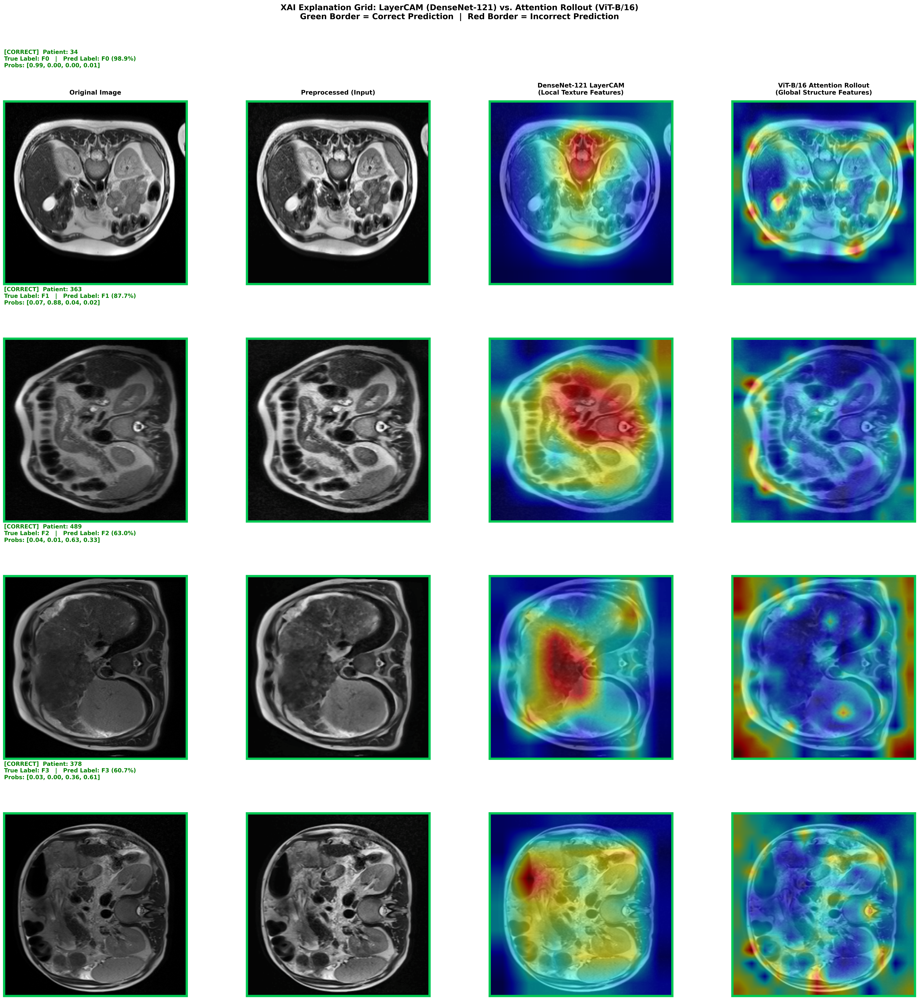

Fig 10 (XAI with True/Pred labels) saved successfully at 300 DPI.


In [35]:
if SEASON == 2:


    import math as _math
    import gc
    import os
    import cv2
    import torch
    import torch.nn.functional as F
    import numpy as np
    import matplotlib.pyplot as plt
    
    # --- 1. Load Ensemble Models for Robust XAI Predictions ---
    
    ckpt_paths = [f"hybrid_fold{i+1}_best.pth" for i in range(CFG.N_SPLITS) 
                  if os.path.exists(f"hybrid_fold{i+1}_best.pth")]
    gc.collect(); torch.cuda.empty_cache()
    
    ens_models = []
    for ckpt in ckpt_paths:
        m = HybridDenseViT().to(CFG.DEVICE)
        m.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        m.eval()
        ens_models.append(m)
    
    # Fallback to single xai_model if ensemble weights are not found
    if len(ens_models) == 0:
        ens_models = [xai_model]
    
    print(f"XAI Inference: {len(ens_models)} model(s) loaded.")
    
    # Primary model used specifically for CAM hooks
    cam_model = ens_models[0]
    cam_cnn = LayerCAM(model=cam_model, target_layers=[cam_model.cnn.features.norm5])
    
    cls_names = list(class_map.keys())
    
    # --- 2. Visualization Setup ---
    
    fig, axes = plt.subplots(CFG.NUM_CLASSES, 4, figsize=(24, 6 * CFG.NUM_CLASSES))
    col_titles = [
        "Original Image",
        "Preprocessed (Input)",
        "DenseNet-121 LayerCAM\n(Local Texture Features)",
        "ViT-B/16 Attention Rollout\n(Global Structure Features)"
    ]
    
    for ci in range(CFG.NUM_CLASSES):
        # Fetch sample row
        row = df[df["diagnosis"] == ci].sample(1, random_state=ci * 7).iloc[0]
        path = row.image_path
        patient_id = getattr(row, "patient_id", f"P_{ci}")
        
        orig = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
        orig = cv2.resize(orig, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        
        prep = preprocess_for_model(path)
        if prep is None: 
            prep = orig.copy()
        prep = cv2.resize(prep, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        flt = np.clip(prep.astype(np.float32) / 255.0, 0, 1)
        
        inp = valid_tfms(image=prep)["image"].unsqueeze(0).to(CFG.DEVICE)
    
        # --- Ensemble Prediction ---
        all_probs = []
        with torch.no_grad():
            for m in ens_models:
                p = F.softmax(m(inp), dim=1).cpu().numpy()[0]
                all_probs.append(p)
                
        probs = np.mean(all_probs, axis=0)
        pred = int(np.argmax(probs))
        conf = float(probs[pred])
        is_correct = (pred == ci)
    
        # --- Generate Heatmaps ---
        try:
            gcam = cam_cnn(input_tensor=inp, targets=[ClassifierOutputTarget(pred)])[0]
            hm_cnn = show_cam_on_image(flt, gcam, use_rgb=True)
        except Exception as e:
            print(f"  LayerCAM error F{ci}: {e}")
            hm_cnn = orig.copy()
    
        rollout = attention_rollout(cam_model.vit, inp)
        hm_vit = show_cam_on_image(flt, rollout, use_rgb=True)
    
        # Styling colors
        border_color = "#00C853" if is_correct else "#D50000"
        text_color   = "green" if is_correct else "red"
        status_str   = "CORRECT" if is_correct else f"WRONG (Pred: {cls_names[pred]})"
    
        # Title label formatting similar to clinical interface
        header_title = (
            f"[{status_str}]  Patient: {patient_id}\n"
            f"True Label: {cls_names[ci]}   |   Pred Label: {cls_names[pred]} ({conf:.1%})\n"
            f"Probs: [{probs[0]:.2f}, {probs[1]:.2f}, {probs[2]:.2f}, {probs[3]:.2f}]"
        )
    
        row_imgs = [orig, prep, hm_cnn, hm_vit]
    
        for col_i, (ax, img) in enumerate(zip(axes[ci], row_imgs)):
            ax.imshow(img, cmap="gray" if img.ndim == 2 else None)
            
            # Add column headers on the top row
            if ci == 0:
                ax.set_title(col_titles[col_i], fontsize=11, fontweight="bold", pad=12)
    
            # Apply colored bounding box around all subplots
            for sp in ax.spines.values():
                sp.set_edgecolor(border_color)
                sp.set_linewidth(4)
                sp.set_visible(True)
    
            ax.set_xticks([])
            ax.set_yticks([])
    
        # Display prediction details centered over the entire row's image block
        axes[ci][0].text(
            0.0, 1.18, header_title,
            transform=axes[ci][0].transAxes,
            fontsize=10, fontweight="bold", color=text_color,
            va="bottom", ha="left"
        )
    
    plt.suptitle(
        "XAI Explanation Grid: LayerCAM (DenseNet-121) vs. Attention Rollout (ViT-B/16)\n"
        "Green Border = Correct Prediction  |  Red Border = Incorrect Prediction",
        fontsize=14, fontweight="bold", y=1.02
    )
    
    plt.tight_layout()
    plt.savefig("fig10A_xai_clinical.png", dpi=300, bbox_inches="tight")
    plt.show()
    
    print("Fig 10 (XAI with True/Pred labels) saved successfully at 300 DPI.")
    
    # Clean up memory
    del ens_models
    gc.collect()
    torch.cuda.empty_cache()

Ensemble: 5 fold models loaded.

Clinical interface: 18/20 correct (90%)


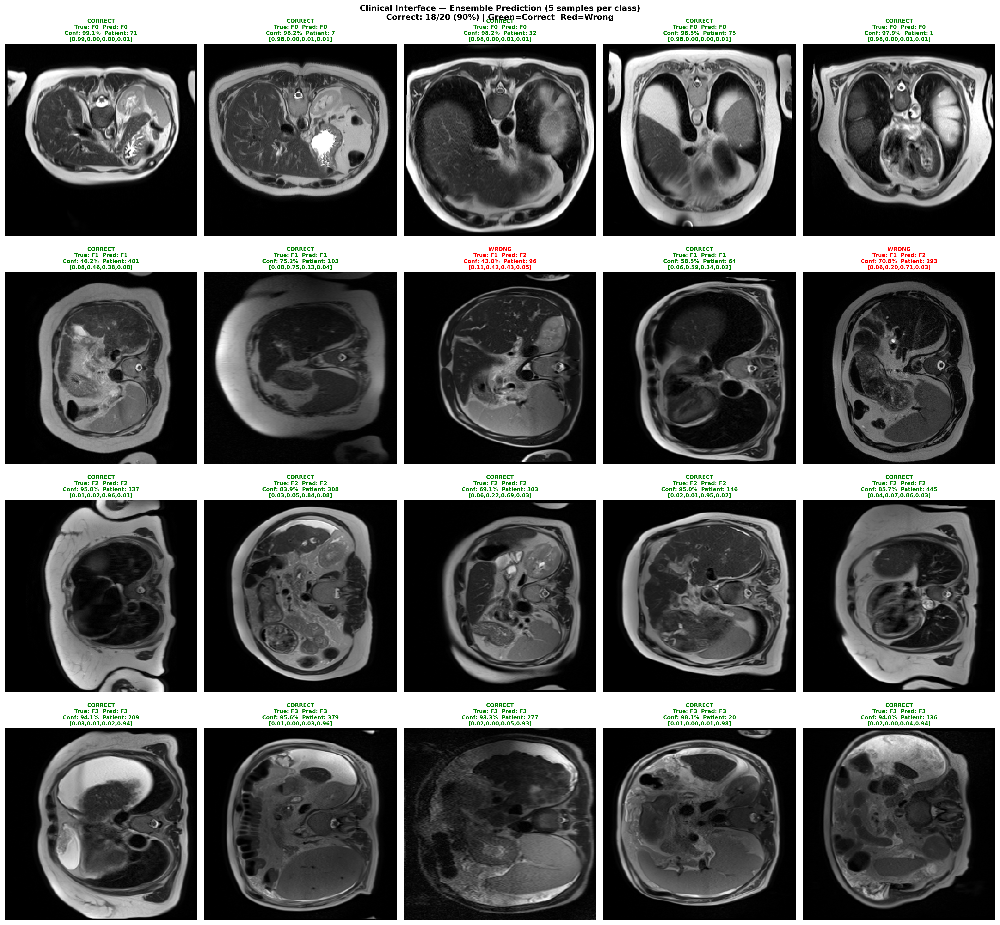

Clinical interface saved at 300 DPI.


In [36]:
if SEASON == 2:


    import math as _math
    
    N_SAMPLES = 20
    cls_names = list(class_map.keys())
    
    ckpt_paths = [f"hybrid_fold{i+1}_best.pth" for i in range(CFG.N_SPLITS)
                  if os.path.exists(f"hybrid_fold{i+1}_best.pth")]
    gc.collect(); torch.cuda.empty_cache()
    ens_models = []
    for ckpt in ckpt_paths:
        m = HybridDenseViT().to(CFG.DEVICE)
        m.load_state_dict(torch.load(ckpt, map_location=CFG.DEVICE))
        m.eval()
        ens_models.append(m)
    print(f"Ensemble: {len(ens_models)} fold models loaded.")
    
    def ensemble_predict(img_path):
        img = preprocess_for_model(img_path)
        if img is None: return 0, 0.0, np.zeros(CFG.NUM_CLASSES)
        img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        inp = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)
        all_probs = []
        with torch.no_grad():
            for m in ens_models:
                p = F.softmax(m(inp), dim=1).cpu().numpy()[0]
                all_probs.append(p)
        avg  = np.mean(all_probs, axis=0)
        pred = int(np.argmax(avg))
        return pred, float(avg[pred]), avg
    
    sample_rows = []
    for cls in range(CFG.NUM_CLASSES):
        cls_df = df[df["diagnosis"]==cls]
        sample_rows.append(cls_df.sample(min(5,len(cls_df)), random_state=42))
    sample_df = pd.concat(sample_rows).reset_index(drop=True)
    
    results = []
    for _, row in sample_df.iterrows():
        pred, conf, probs = ensemble_predict(row.image_path)
        results.append({"path": row.image_path, "pid": row.patient_id,
                        "true": int(row.diagnosis), "pred": pred,
                        "conf": conf, "probs": probs,
                        "correct": pred==int(row.diagnosis)})
    
    n_correct = sum(r["correct"] for r in results)
    print(f"\nClinical interface: {n_correct}/{len(results)} correct ({n_correct/len(results):.0%})")
    
    ncols = 5
    nrows = _math.ceil(len(results)/ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*4.2, nrows*5))
    axes = axes.flatten()
    
    for idx, (r, ax) in enumerate(zip(results, axes)):
        img = cv2.cvtColor(cv2.imread(r["path"]), cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        ax.imshow(img, cmap="gray")
        bc = "#00C853" if r["correct"] else "#D50000"
        for sp in ax.spines.values():
            sp.set_edgecolor(bc); sp.set_linewidth(5)
        status = "CORRECT" if r["correct"] else "WRONG"
        tc     = "green" if r["correct"] else "red"
        ax.set_title(
            f"{status}\nTrue: {cls_names[r['true']]}  Pred: {cls_names[r['pred']]}\n"
            f"Conf: {r['conf']:.1%}  Patient: {r['pid']}\n"
            f"[{r['probs'][0]:.2f},{r['probs'][1]:.2f},{r['probs'][2]:.2f},{r['probs'][3]:.2f}]",
            fontsize=8, color=tc, fontweight="bold", pad=4)
        ax.axis("off")
    
    for ax in axes[len(results):]: ax.set_visible(False)
    
    plt.suptitle(
        f"Clinical Interface — Ensemble Prediction (5 samples per class)\n"
        f"Correct: {n_correct}/{len(results)} ({n_correct/len(results):.0%}) | "
        f"Green=Correct  Red=Wrong",
        fontsize=12, fontweight="bold")
    plt.tight_layout()
    plt.savefig("fig_clinical_interface.png", dpi=300, bbox_inches="tight")
    plt.show()
    print("Clinical interface saved at 300 DPI.")
    del ens_models; gc.collect(); torch.cuda.empty_cache()

## Cell 28 — Ensemble model

In [37]:
if SEASON == 2:
    class EnsembleModel(nn.Module):
        def __init__(self, ckpt_paths):
            super().__init__()
            self.models = nn.ModuleList()
            for p in ckpt_paths:
                m = HybridDenseViT()
                m.load_state_dict(torch.load(p, map_location=CFG.DEVICE))
                m.eval(); self.models.append(m)
            print(f"Ensemble: {len(self.models)} fold models.")
        def forward(self, x):
            return torch.mean(torch.stack([F.softmax(m(x),1) for m in self.models]),0)
    
    avail  = [f"hybrid_fold{i+1}_best.pth" for i in range(CFG.N_SPLITS)
              if os.path.exists(f"hybrid_fold{i+1}_best.pth")]
    ens    = EnsembleModel(avail).to(CFG.DEVICE)
    torch.save(ens.state_dict(), "ensemble_hybrid_mri_v2.pth")
    print("Ensemble saved.")


Ensemble: 5 fold models.
Ensemble saved.


## Cell 29 — Final summary

In [38]:
if SEASON == 2:

    print("="*65)
    print("  FINAL SUMMARY — HybridDenseViT v2  (MRI T2W)")
    print("="*65)
    print(f"  Dataset   : cirrMRI600+  |  {n_slices} slices  |  {n_patients} patients")
    print(f"  CV        : StratifiedGroupKFold  5-fold  patient-level  ✓")
    print()
    print("  Key v2 changes vs v1:")
    print("    ✓ Curriculum freeze (ViT blocks 0-5, epochs 1-5)")
    print("    ✓ Separate LRs: DenseNet=1e-4, ViT=2e-5, Head=3e-4")
    print("    ✓ OrdinalCrossEntropyLoss + class weights")
    print("    ✓ MixUp disabled (label_smoothing=0.05 only)")
    print("    ✓ BatchSize=16  drop_last=True")
    print("    ✓ GELU in fusion head")
    print()
    print("  ABLATION:")
    print(f"    DenseNet-121 only : QWK {np.mean(d_qwks):.4f} ± {np.std(d_qwks):.4f}")
    print(f"    ViT-B/16 only     : QWK {np.mean(v_qwks):.4f} ± {np.std(v_qwks):.4f}")
    print(f"    HybridDenseViT v2 : QWK {np.mean(h_qwks):.4f} ± {np.std(h_qwks):.4f}  ← proposed")
    print()
    h_ci_q = ci95(h_qwks)
    print(f"  OOF QWK    : {oof_qwk:.4f}")
    print(f"  OOF Acc    : {oof_acc:.4f}")
    print(f"  QWK 95%CI  : [{h_ci_q[0]:.4f}, {h_ci_q[1]:.4f}]")
    print()
    print("  XAI: LayerCAM (DenseNet) + Attention Rollout (ViT)  ✓")
    figs = sorted([f for f in os.listdir(".") if f.startswith("fig") and f.endswith(".png")])
    print(f"  Saved {len(figs)} figures at 300 DPI:")
    for f in figs: print(f"    {f}")


  FINAL SUMMARY — HybridDenseViT v2  (MRI T2W)
  Dataset   : cirrMRI600+  |  15 slices  |  305 patients
  CV        : StratifiedGroupKFold  5-fold  patient-level  ✓

  Key v2 changes vs v1:
    ✓ Curriculum freeze (ViT blocks 0-5, epochs 1-5)
    ✓ Separate LRs: DenseNet=1e-4, ViT=2e-5, Head=3e-4
    ✓ OrdinalCrossEntropyLoss + class weights
    ✓ MixUp disabled (label_smoothing=0.05 only)
    ✓ BatchSize=16  drop_last=True
    ✓ GELU in fusion head

  ABLATION:
    DenseNet-121 only : QWK 0.8695 ± 0.0296
    ViT-B/16 only     : QWK 0.9056 ± 0.0242
    HybridDenseViT v2 : QWK 0.9141 ± 0.0239  ← proposed

  OOF QWK    : 0.9154
  OOF Acc    : 0.8599
  QWK 95%CI  : [0.8808, 0.9473]

  XAI: LayerCAM (DenseNet) + Attention Rollout (ViT)  ✓
  Saved 14 figures at 300 DPI:
    fig10A_xai_clinical.png
    fig10_xai.png
    fig1_class_distribution.png
    fig2_samples.png
    fig3_preprocessing.png
    fig4_augmentations.png
    fig5_training_curves.png
    fig6_ablation_bars.png
    fig7_per_fo

In [39]:
import os
import zipfile

def zip_outputs(zip_name="outputs_and_models.zip"):
    base_dir = "/kaggle/working"  # default working directory in Kaggle
    zip_path = os.path.join(base_dir, zip_name)

    # Remove existing zip if present
    if os.path.exists(zip_path):
        os.remove(zip_path)

    # Create zip and add files
    with zipfile.ZipFile(zip_path, "w", zipfile.ZIP_DEFLATED) as zf:
        for root, dirs, files in os.walk(base_dir):
            for f in files:
                # Optionally skip some files
                if f.endswith(".pth") or f.endswith(".pt") or f.endswith(".png") or f.endswith(".csv") or f.endswith(".ipynb"):
                    full_path = os.path.join(root, f)
                    # Relative path inside the zip
                    rel_path = os.path.relpath(full_path, base_dir)
                    zf.write(full_path, rel_path)

    print(f"Created zip at: {zip_path}")

zip_outputs("hybrid_densvit_v2_all_artifacts.zip")

Created zip at: /kaggle/working/hybrid_densvit_v2_all_artifacts.zip


In [42]:
import os
from IPython.display import FileLink, display

os.chdir('/kaggle/working')
print("Current dir:", os.getcwd())
print("Exists:", os.path.exists("hybrid_densvit_v2_all_artifacts.zip"))

display(FileLink("hybrid_densvit_v2_all_artifacts.zip"))

Current dir: /kaggle/working
Exists: True


/kaggle/working/hybrid_densvit_v2_all_artifacts.zip